## 超新星の EDA をして金圏まで上り詰める

In [146]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
%config InlineBackend.figure_formats = {'png', 'retina'}

### CPMP は class 52 をうまく分類できている

In [1]:
import pandas as pd
import numpy as np

import pickle

In [2]:
meta_df = pd.read_csv('/home/naoya.taguchi/.kaggle/competitions/PLAsTiCC-2018/training_set_metadata.csv')
meta_df

,object_id,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target
0,615,349.046051,-61.943836,320.796530,-51.753706,1,0.0000,0.0000,0.0000,NaN,0.017,92
1,713,53.085938,-27.784405,223.525509,-54.460748,1,1.8181,1.6267,0.2552,45.4063,0.007,88
2,730,33.574219,-6.579593,170.455585,-61.548219,1,0.2320,0.2262,0.0157,40.2561,0.021,42
3,745,0.189873,-45.586655,328.254458,-68.969298,1,0.3037,0.2813,1.1523,40.7951,0.007,90
4,1124,352.711273,-63.823658,316.922299,-51.059403,1,0.1934,0.2415,0.0176,40.4166,0.024,90
5,1227,35.683594,-5.379379,171.992947,-59.253501,1,0.0000,0.0000,0.0000,NaN,0.020,65
6,1598,347.846710,-64.760857,318.929827,-49.143596,1,0.1352,0.1820,0.0304,39.7279,0.019,90
7,1632,348.595886,-63.072620,320.023289,-50.713060,1,0.6857,0.7014,0.0100,43.1524,0.021,42
8,1920,149.414062,3.433834,234.919132,42.245550,1,0.3088,0.3229,0.3360,41.1401,0.027,90
9,1926,149.414062,1.940072,236.565366,41.393323,1,0.0000,0.0000,0.0000,NaN,0.018,65


In [4]:
set_df = pd.read_csv('/home/naoya.taguchi/.kaggle/competitions/PLAsTiCC-2018/training_set.csv')
set_df

,object_id,mjd,passband,flux,flux_err,detected,phase
0,615,59750.4229,2,-544.810303,3.622952,1,0.816429
1,615,59750.4306,1,-816.434326,5.553370,1,0.840157
2,615,59750.4383,3,-471.385529,3.801213,1,0.863886
3,615,59750.4450,4,-388.984985,11.395031,1,0.884533
4,615,59752.4070,2,-681.858887,4.041204,1,0.930728
5,615,59752.4147,1,-1061.457031,6.472994,1,0.954457
6,615,59752.4224,3,-524.954590,3.552751,1,0.978185
7,615,59752.4334,4,-393.480225,3.599346,1,0.012084
8,615,59752.4435,5,-355.886780,10.421921,1,0.043208
9,615,59767.2968,2,-548.013550,3.462291,1,0.815862


In [23]:
meta_df['lumidist'] = 10**((meta_df['distmod']+5)/5)
set_df = set_df.merge(meta_df[['object_id', 'lumidist']])
set_df['luminosity'] = 4*np.pi*(set_df.lumidist**2)*set_df.flux

#### まずは lightcurve 出してみる

In [57]:
sorted(meta_df.target.unique())

[6, 15, 16, 42, 52, 53, 62, 64, 65, 67, 88, 90, 92, 95]

In [59]:
ddf = 1

obj_15 = meta_df[(meta_df.target == 15) & (meta_df.ddf == ddf)].object_id
obj_16 = meta_df[(meta_df.target == 16) & (meta_df.ddf == ddf)].object_id
obj_42 = meta_df[(meta_df.target == 42) & (meta_df.ddf == ddf)].object_id
obj_52 = meta_df[(meta_df.target == 52) & (meta_df.ddf == ddf)].object_id
obj_53 = meta_df[(meta_df.target == 53) & (meta_df.ddf == ddf)].object_id
obj_62 = meta_df[(meta_df.target == 62) & (meta_df.ddf == ddf)].object_id
obj_64 = meta_df[(meta_df.target == 64) & (meta_df.ddf == ddf)].object_id
obj_65 = meta_df[(meta_df.target == 65) & (meta_df.ddf == ddf)].object_id
obj_67 = meta_df[(meta_df.target == 67) & (meta_df.ddf == ddf)].object_id
obj_88 = meta_df[(meta_df.target == 88) & (meta_df.ddf == ddf)].object_id
obj_90 = meta_df[(meta_df.target == 90) & (meta_df.ddf == ddf)].object_id
obj_92 = meta_df[(meta_df.target == 92) & (meta_df.ddf == ddf)].object_id
obj_95 = meta_df[(meta_df.target == 95) & (meta_df.ddf == ddf)].object_id

In [45]:
colors = ['#FF0000', '#FFB600', '#68FF00', '#00E4FF', '#0F00FF', '#C100FF', ]

def plot_passbands(df, ax):
    for passband in [0, 1, 2, 3, 4, 5]:
        band_df = df[df.passband == passband]
        ax.scatter(x=band_df.mjd, y=band_df.flux, color=colors[passband])
        
def plot_passbands_fixedmjd(df, ax, photoz):
    for passband in [0, 1, 2, 3, 4, 5]:
        band_df = df[df.passband == passband]
        ax.scatter(x=band_df.mjd*(photoz+1), y=band_df.flux, color=colors[passband])
        #ax.scatter(x=band_df.mjd*(photoz+1), y=band_df.luminosity, color=colors[passband])
        
def plot_passbands_fixedmjd_err(df, ax, photoz):
    for passband in [0, 1, 2, 3, 4, 5]:
        band_df = df[df.passband == passband]
        ax.scatter(x=band_df.mjd*(photoz+1), y=band_df.flux/band_df.flux_err, color=colors[passband])

### sn の specz, photoz をみてみる

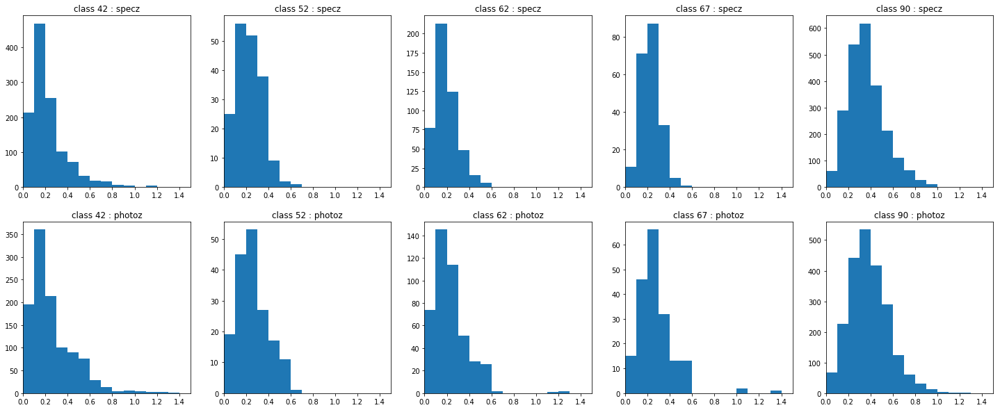

In [28]:
sn_targets = [42, 52, 62, 67, 90]
figrows, figcols = 2, 5
fig, axs = plt.subplots(figrows, figcols, figsize=(figcols*5, figrows*5))

for i, sn_target in enumerate(sn_targets):
    ax1, ax2 = axs[0, i], axs[1, i]
    sn_target_df = meta_df[meta_df.target == sn_target]
    ax1.hist(sn_target_df.hostgal_specz, bins=(np.arange(0., 1.5, 0.1)))
    ax1.set_xlim(0., 1.5)
    ax1.set_title(f'class {sn_target} : specz')
    ax2.hist(sn_target_df.hostgal_photoz, bins=(np.arange(0., 1.5, 0.1)))
    ax2.set_xlim(0., 1.5)
    ax2.set_title(f'class {sn_target} : photoz')

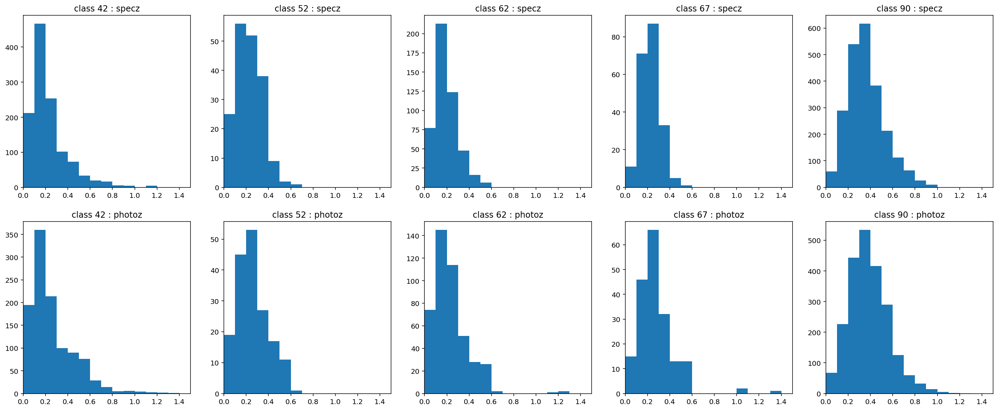

In [84]:
sn_targets = [42, 52, 62, 67, 90]
figrows, figcols = 2, 5
fig, axs = plt.subplots(figrows, figcols, figsize=(figcols*5, figrows*5))

for i, sn_target in enumerate(sn_targets):
    ax1, ax2 = axs[0, i], axs[1, i]
    sn_target_df = meta_df[meta_df.target == sn_target]
    ax1.hist(sn_target_df.hostgal_specz, bins=(np.arange(0., 1.5, 0.1)))
    ax1.set_xlim(0., 1.5)
    ax1.set_title(f'class {sn_target} : specz')
    ax2.hist(sn_target_df.hostgal_photoz, bins=(np.arange(0., 1.5, 0.1)))
    ax2.set_xlim(0., 1.5)
    ax2.set_title(f'class {sn_target} : photoz')

IndexError: index 2 is out of bounds for axis 0 with size 2

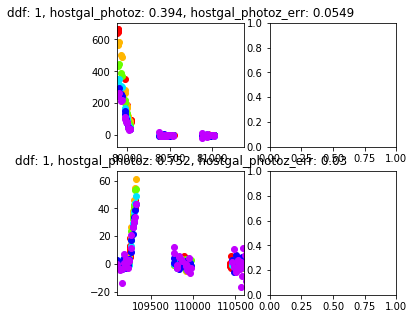

In [60]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(5, 5))

for i, obj_id in enumerate(obj_15.sample(4, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df, ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

### mjd で期間補正して sn 分けれない？

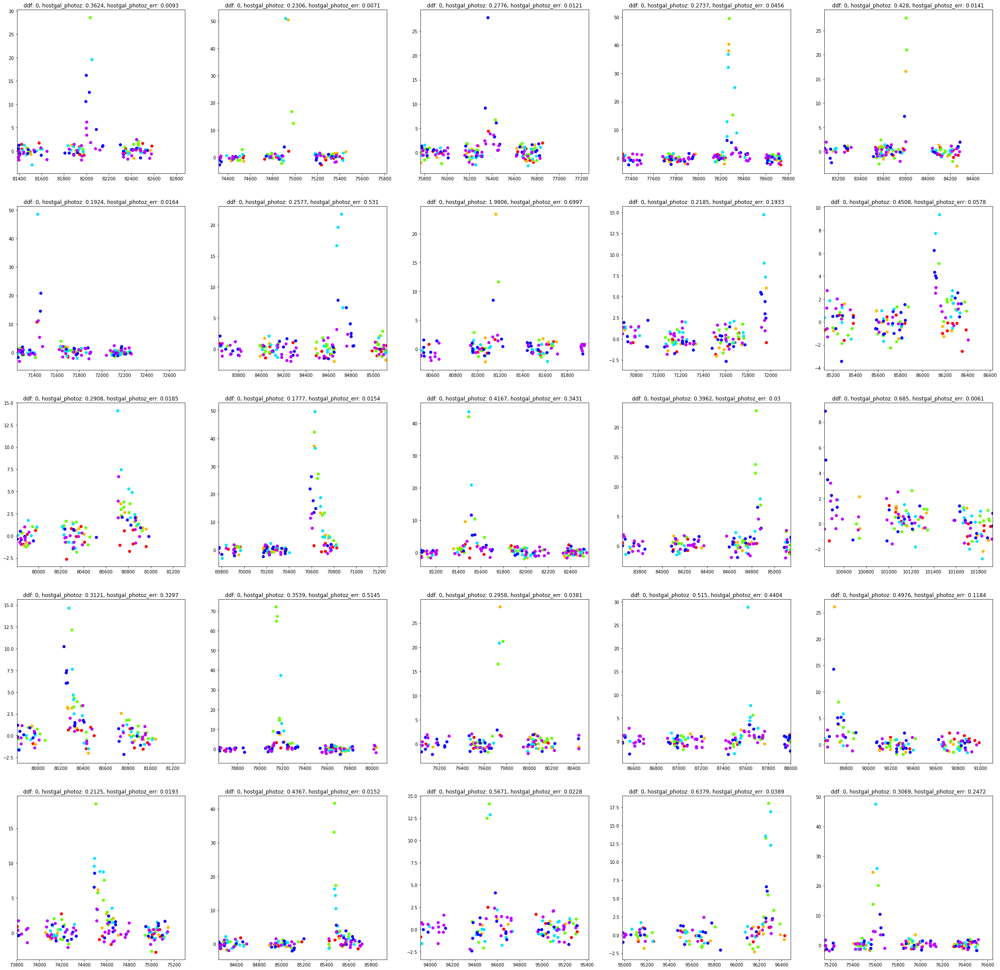

In [43]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df, ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

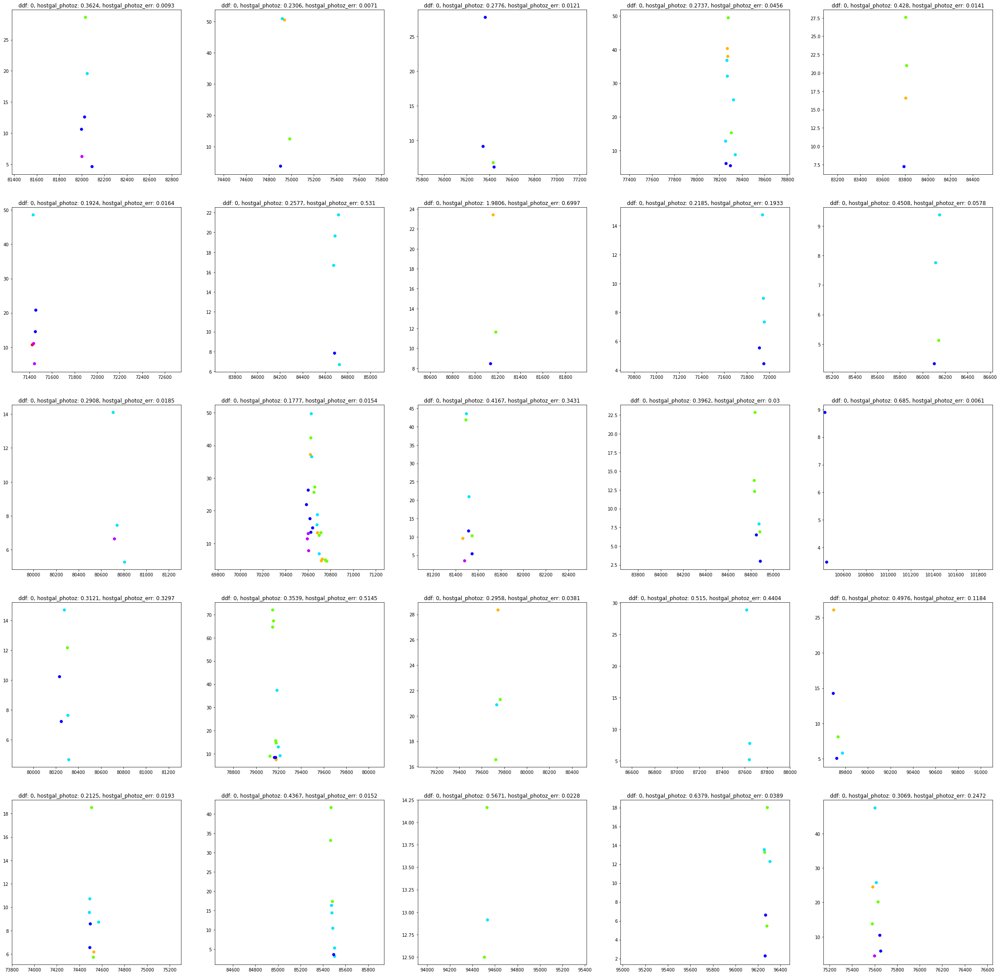

In [44]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df[df.detected==1], ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

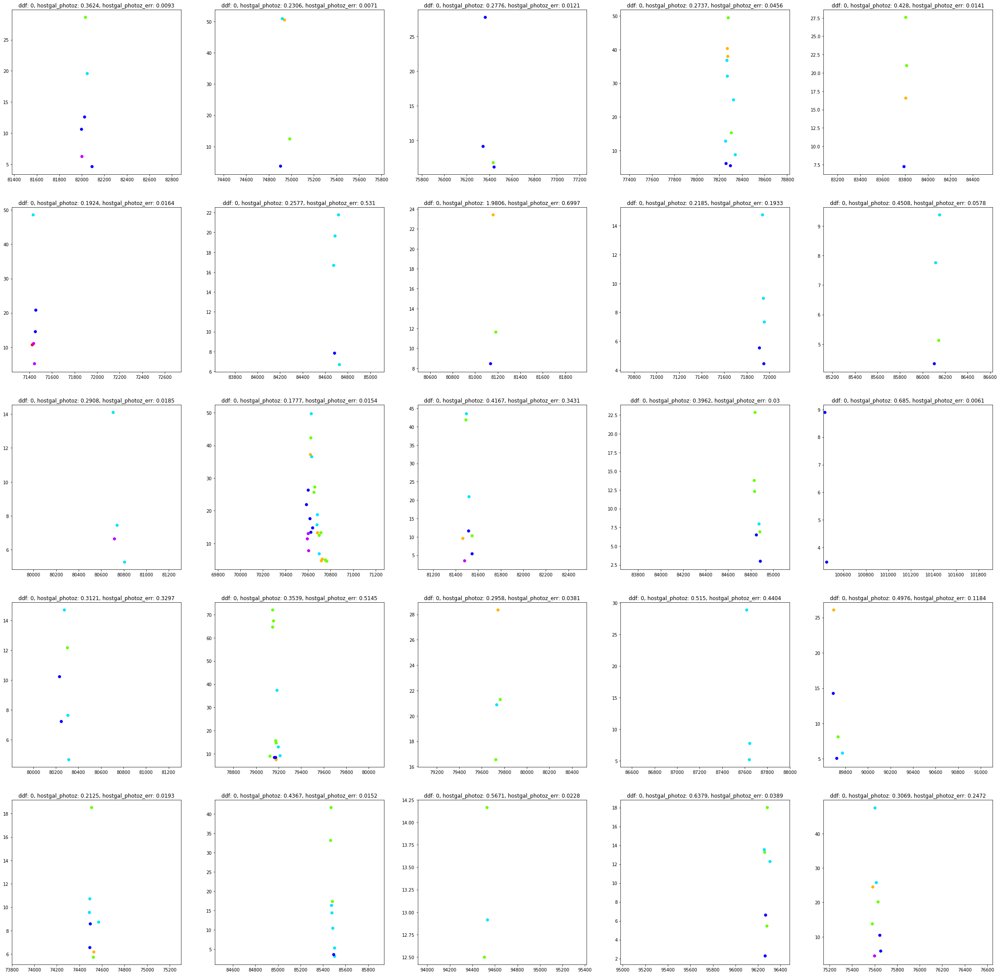

In [44]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df[df.detected==1], ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

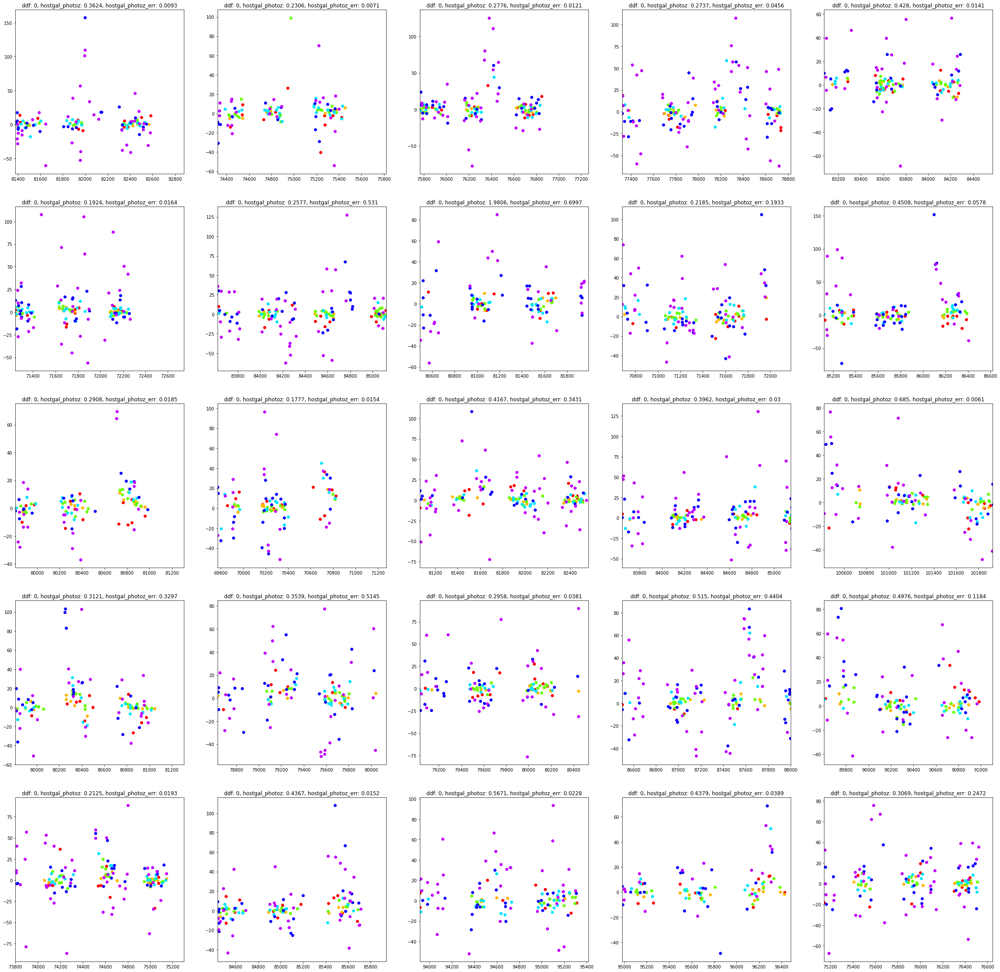

In [52]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df[df.detected==0], ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

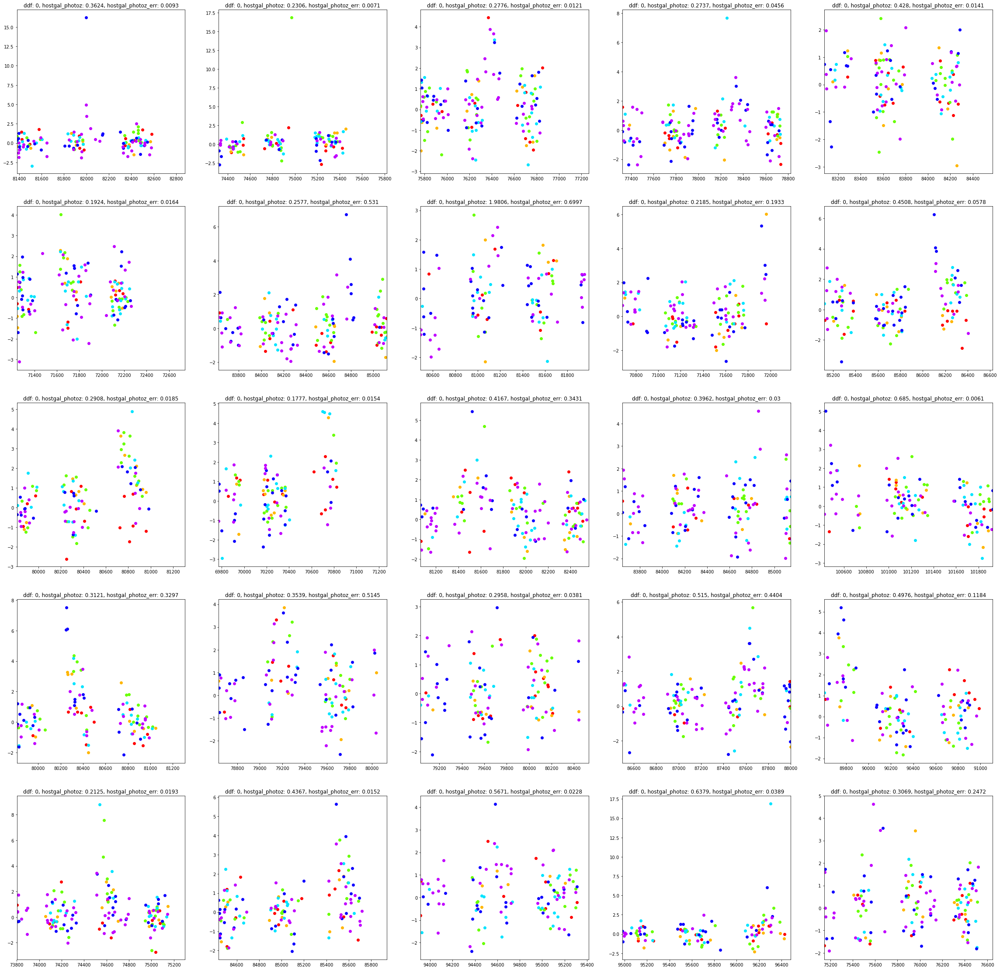

In [53]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd_err(df[df.detected==0], ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

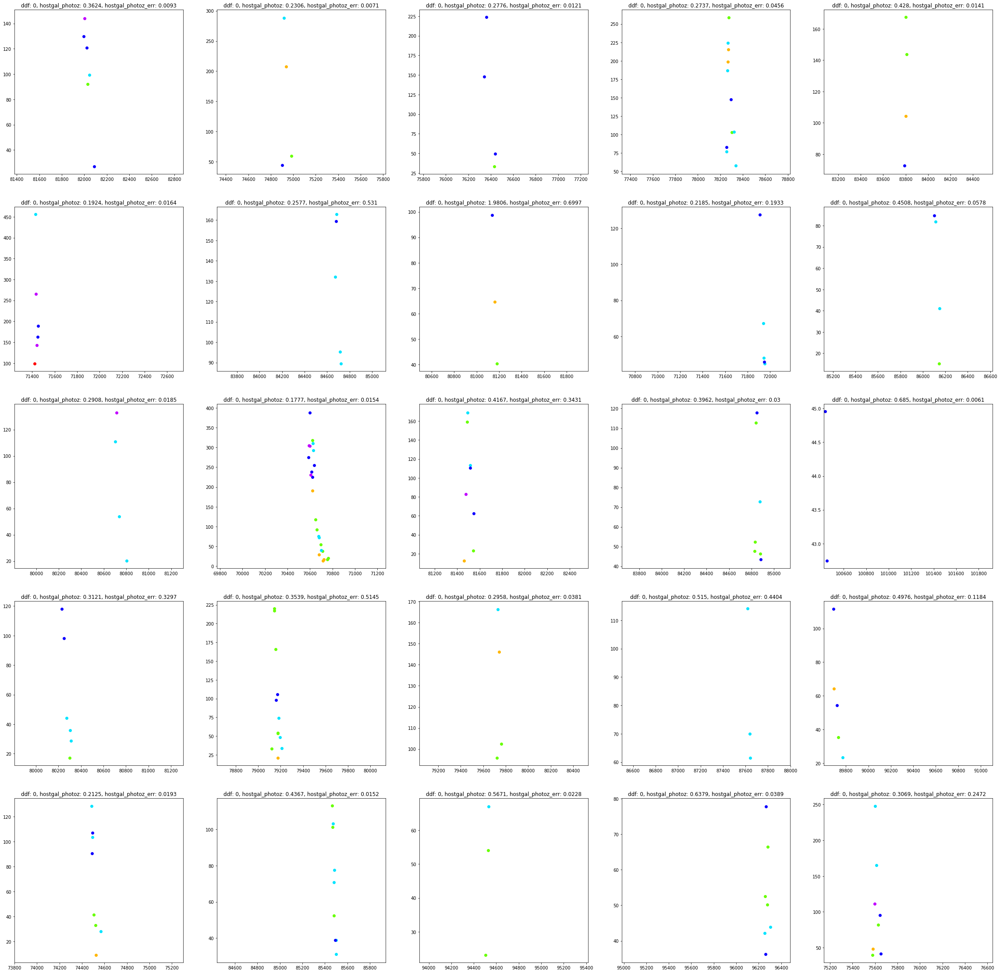

In [47]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df[df.detected==1], ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

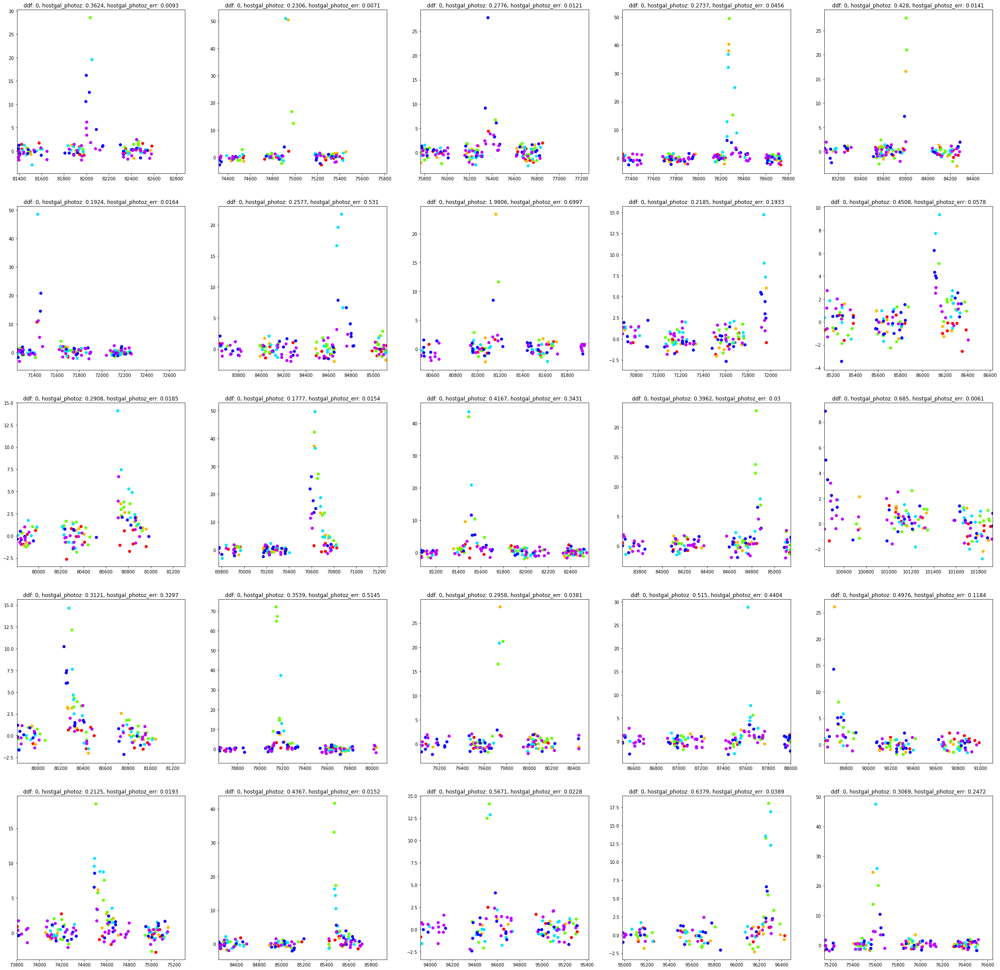

In [33]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    
    meta = meta_df[meta_df.object_id == obj_id]
    photoz = meta.hostgal_specz.values[0]
    plot_passbands_fixedmjd(df, ax, photoz)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
    ax.set_xlim((df.mjd.min() * (photoz+1), df.mjd.min() * (photoz+1) + 1500))
plt.show ()   

### 各 SN の lightcurve 見てみる

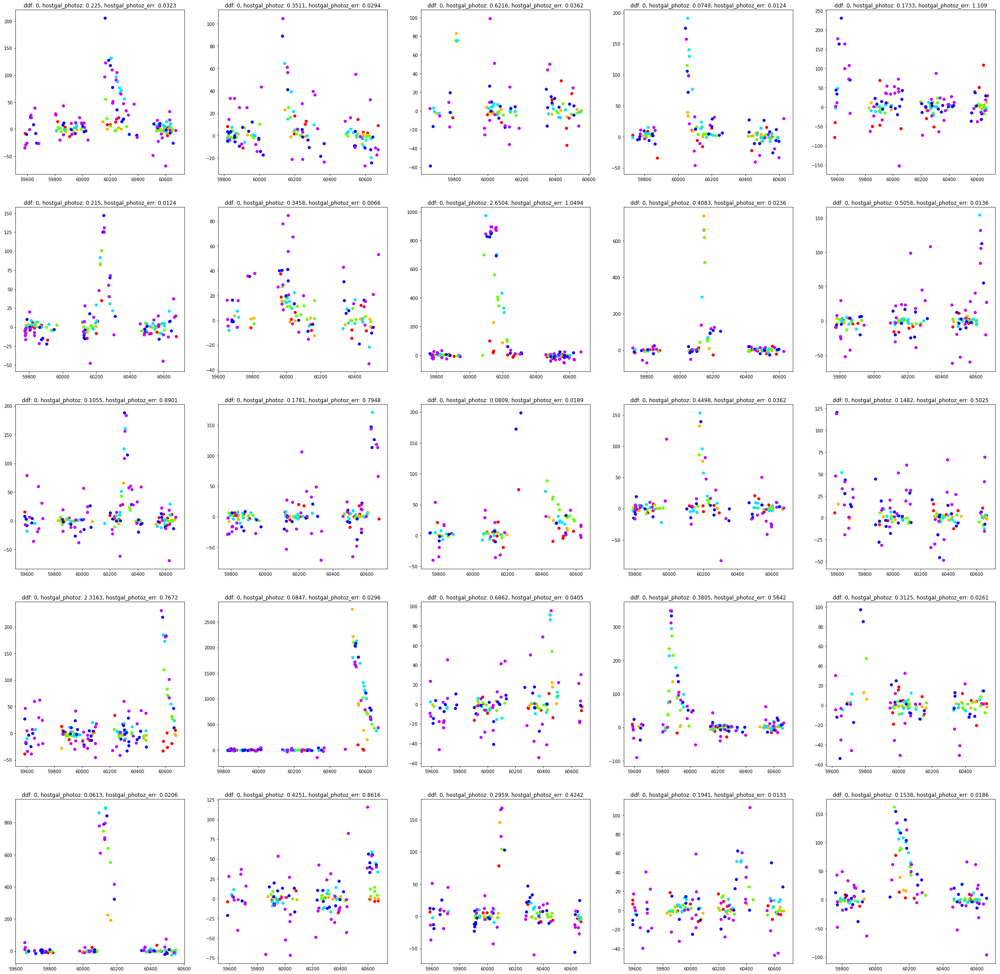

In [9]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_42.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

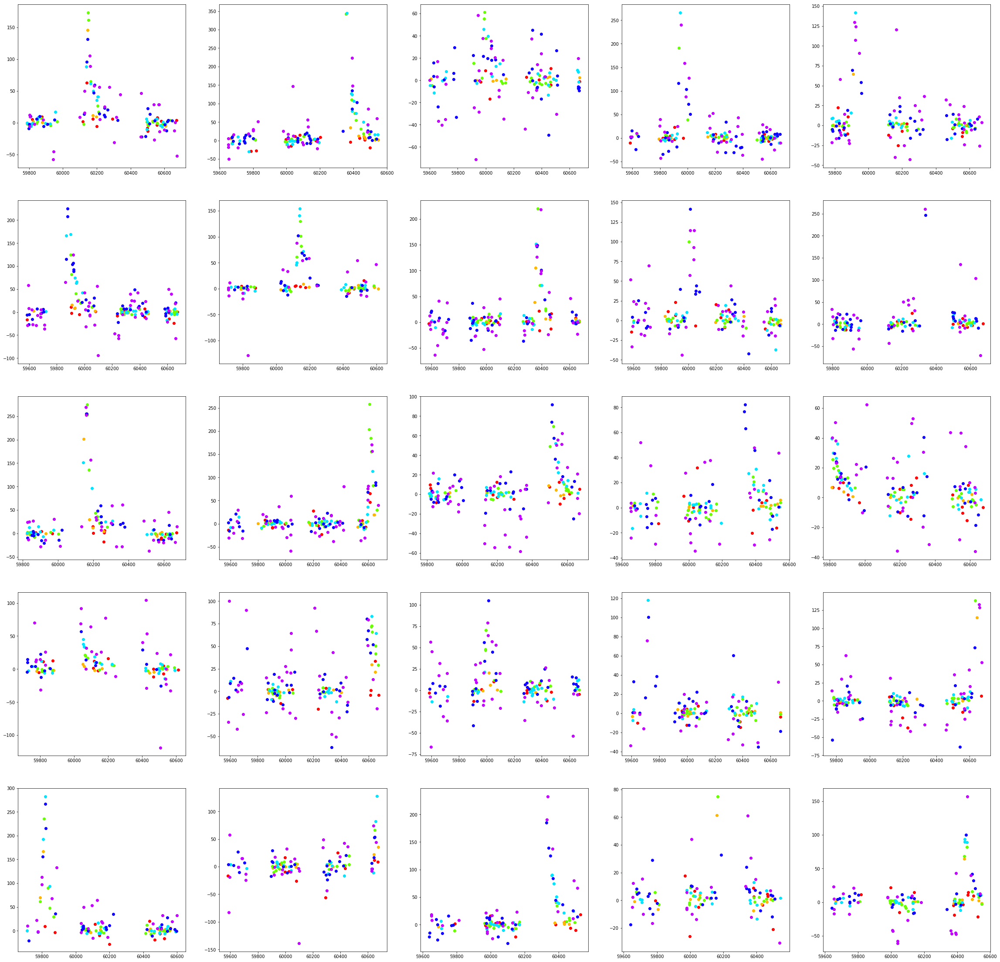

In [89]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_52.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    plot_passbands(df, ax)
plt.show ()   

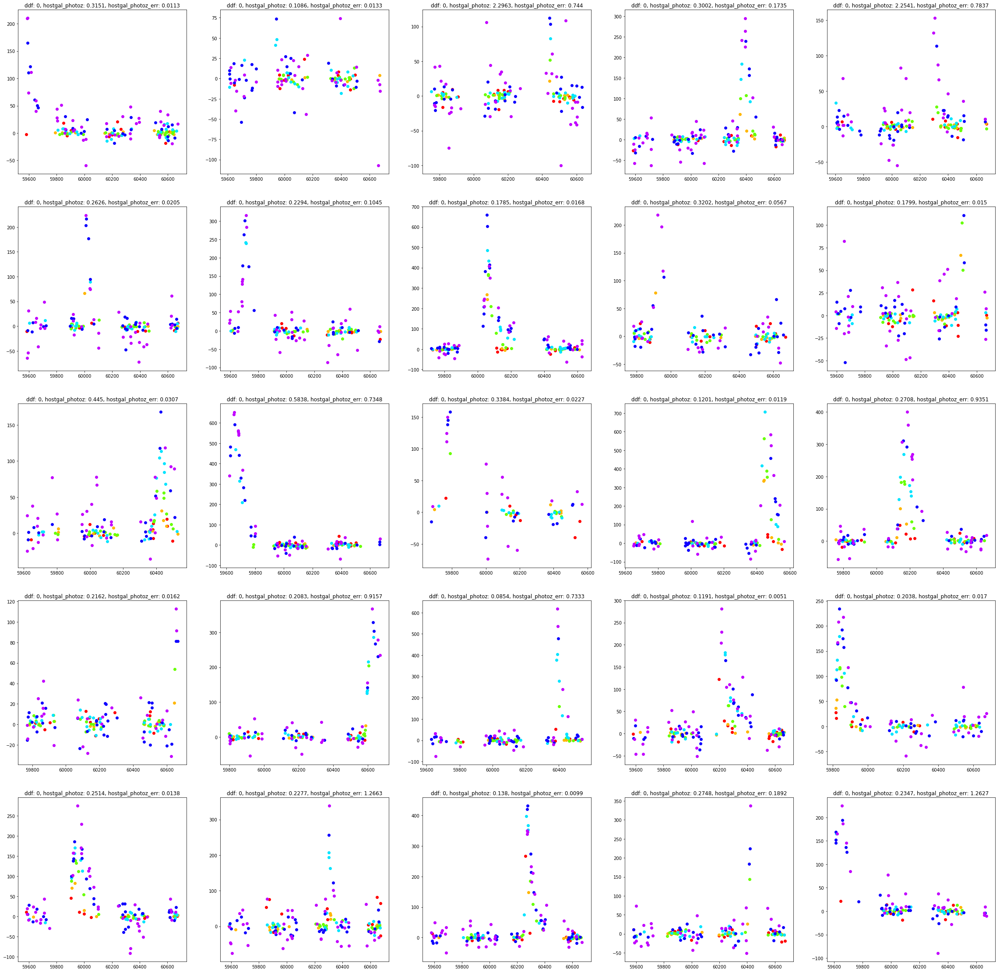

In [90]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_62.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

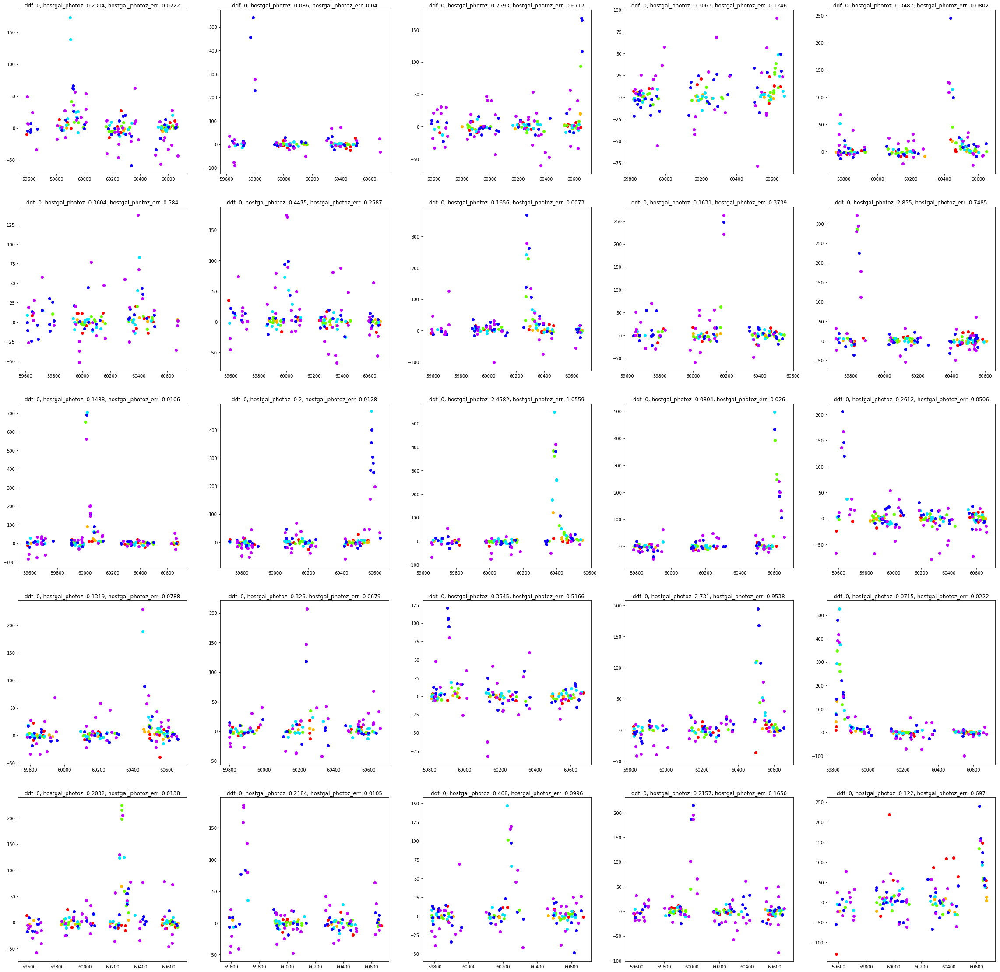

In [91]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_67.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

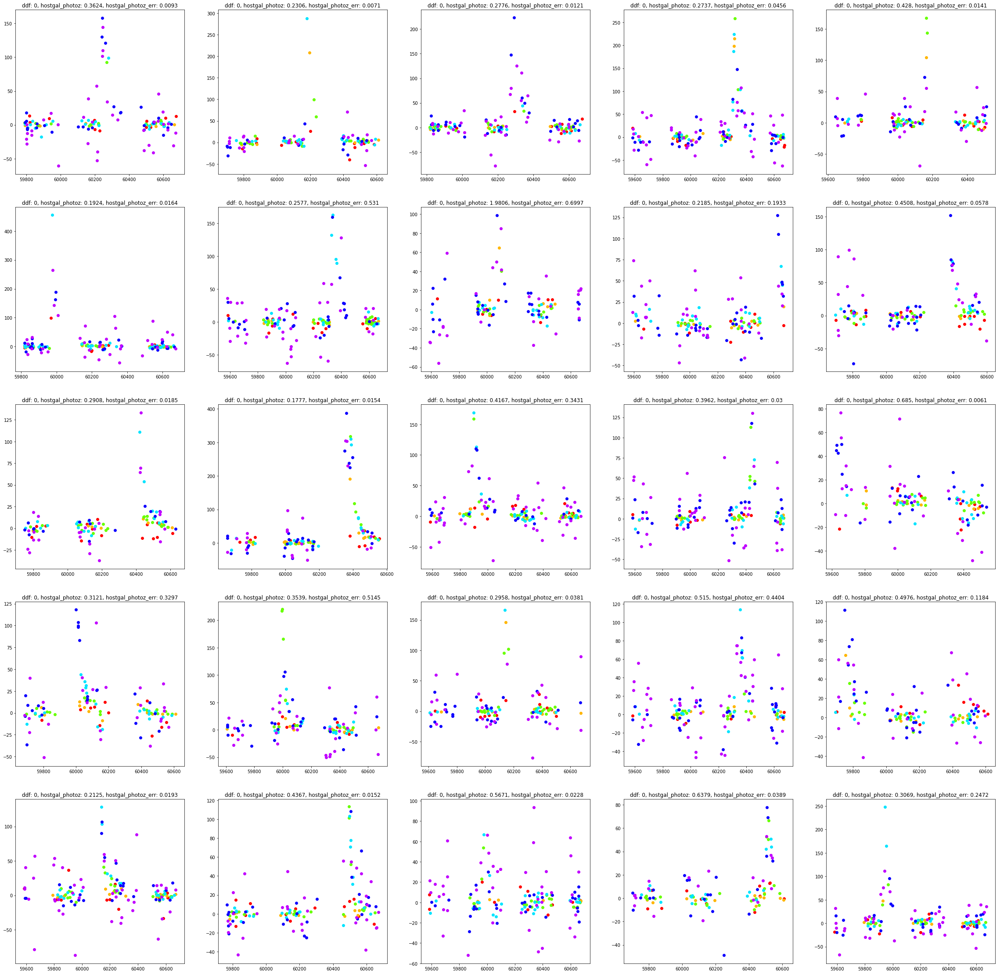

In [92]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

In [32]:
import pickle

with open('../oof/Booster_weight-multi-logloss-0.563267_2018-12-05-00-04-12.pkl', 'rb') as fin:
    oofs = pickle.load(fin)

In [46]:
def softmax(x, axis=1):
    z = np.exp(x)
    return z/np.sum(z, axis=axis, keepdims=True)

classes = ['class_6', 'class_15', 'class_16', 'class_42', 'class_52', 'class_53', 'class_62', 'class_64', 'class_65', 'class_67', 'class_88', 'class_90', 'class_92', 'class_95']
df = pd.DataFrame(softmax(np.concatenate([oof[0] for oof in oofs])), columns=classes)
df['object_id'] = meta_df.object_id.values[np.concatenate([oof[2] for oof in oofs])]
df['target'] = np.concatenate([oof[1] for oof in oofs])
df['target'] = df['target'].apply(lambda x: classes[x])
df.sort_values('object_id', inplace=True)
df
#[np.concatenate([oof[1] for oof in oofs]) == 11]
#[:,-1]

,class_6,class_15,class_16,class_42,class_52,class_53,class_62,class_64,class_65,class_67,class_88,class_90,class_92,class_95,object_id,target
6284,0.000118,0.000046,0.001255,0.000062,0.000054,0.001036,0.000049,0.000041,0.000043,0.000042,0.000066,0.000044,0.997091,0.000052,615,class_92
6285,0.000043,0.000079,0.000373,0.000103,0.000064,0.000030,0.000044,0.000063,0.000030,0.000035,0.998799,0.000078,0.000086,0.000175,713,class_88
4717,0.003777,0.010197,0.003726,0.352660,0.084840,0.004317,0.328114,0.003635,0.003769,0.127782,0.004026,0.063716,0.004237,0.005204,730,class_42
6286,0.002382,0.008686,0.002255,0.133763,0.174784,0.002487,0.005697,0.002082,0.002507,0.007251,0.002407,0.650164,0.002556,0.002978,745,class_90
3146,0.002915,0.006827,0.002761,0.031251,0.553104,0.003195,0.015169,0.002417,0.002893,0.181321,0.003073,0.188811,0.003208,0.003055,1124,class_90
3147,0.001928,0.000944,0.000950,0.001299,0.000802,0.000320,0.000828,0.000311,0.990423,0.000484,0.000365,0.000539,0.000377,0.000431,1227,class_65
4718,0.004122,0.049096,0.004305,0.592592,0.032545,0.006347,0.022915,0.017642,0.004597,0.023537,0.004527,0.207905,0.005378,0.024493,1598,class_90
1574,0.007580,0.011739,0.007556,0.204880,0.035275,0.007983,0.178649,0.049415,0.007578,0.080230,0.022127,0.200030,0.007625,0.179334,1632,class_42
3148,0.001250,0.002056,0.001228,0.011203,0.031747,0.001396,0.003758,0.001071,0.001370,0.001821,0.001380,0.938518,0.001365,0.001837,1920,class_90
4719,0.000810,0.001711,0.008538,0.001744,0.002477,0.000782,0.001895,0.001133,0.975329,0.001071,0.000747,0.001762,0.000947,0.001053,1926,class_65


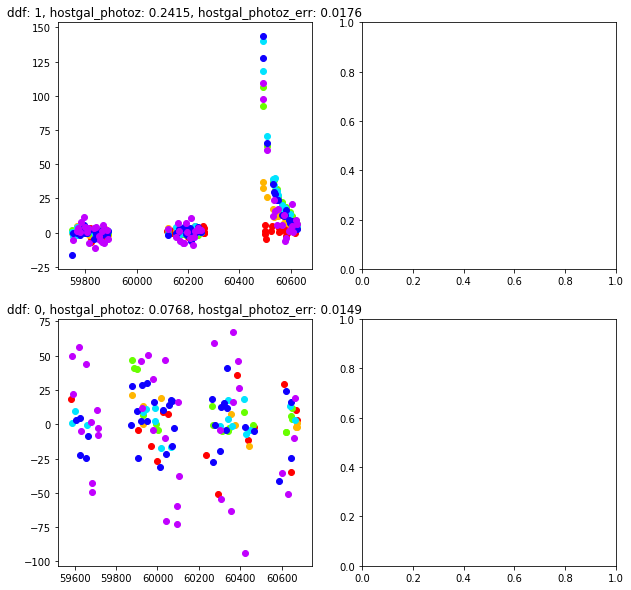

In [51]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for i, obj_id in enumerate([1124, 130359176]):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

In [63]:
set_meta_df = set_df.merge(meta_df, on='object_id', how='left')
set_meta_df

,object_id,mjd,passband,flux,flux_err,detected,phase,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target
0,615,59750.4229,2,-544.810303,3.622952,1,0.816429,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
1,615,59750.4306,1,-816.434326,5.553370,1,0.840157,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
2,615,59750.4383,3,-471.385529,3.801213,1,0.863886,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
3,615,59750.4450,4,-388.984985,11.395031,1,0.884533,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
4,615,59752.4070,2,-681.858887,4.041204,1,0.930728,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
5,615,59752.4147,1,-1061.457031,6.472994,1,0.954457,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
6,615,59752.4224,3,-524.954590,3.552751,1,0.978185,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
7,615,59752.4334,4,-393.480225,3.599346,1,0.012084,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
8,615,59752.4435,5,-355.886780,10.421921,1,0.043208,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92
9,615,59767.2968,2,-548.013550,3.462291,1,0.815862,349.046051,-61.943836,320.796530,-51.753706,1,0.0,0.0,0.0,NaN,0.017,92


In [73]:
from astropy.cosmology import FlatLambdaCDM 
cosmo = FlatLambdaCDM(H0=70, Om0=0.3, Tcmb0=2.725) 
#distance_modulus = cosmo.distmod(redshift)

In [95]:
#set_meta_df['spec_distmod'] =  cosmo.distmod(set_meta_df.hostgal_specz)
set_meta_df['magnitude'] = -2.5*np.log10(set_meta_df.flux)
set_meta_df['abs_magnitude'] = set_meta_df.magnitude - set_meta_df.distmod
set_meta_df['lumidist'] = 10**((set_meta_df.distmod+5)/5)
set_meta_df['luminosity'] = 4*np.pi*(set_meta_df.lumidist**2)*set_meta_df.flux
set_meta_df

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  


,object_id,mjd,passband,flux,flux_err,detected,phase,ra,decl,gal_l,...,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target,magnitude,abs_magnitude,spec_distmod,lumidist,luminosity
0,615,59750.4229,2,-544.810303,3.622952,1,0.816429,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
1,615,59750.4306,1,-816.434326,5.553370,1,0.840157,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
2,615,59750.4383,3,-471.385529,3.801213,1,0.863886,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
3,615,59750.4450,4,-388.984985,11.395031,1,0.884533,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
4,615,59752.4070,2,-681.858887,4.041204,1,0.930728,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
5,615,59752.4147,1,-1061.457031,6.472994,1,0.954457,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
6,615,59752.4224,3,-524.954590,3.552751,1,0.978185,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
7,615,59752.4334,4,-393.480225,3.599346,1,0.012084,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
8,615,59752.4435,5,-355.886780,10.421921,1,0.043208,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN
9,615,59767.2968,2,-548.013550,3.462291,1,0.815862,349.046051,-61.943836,320.796530,...,0.0,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN


In [103]:
colors = ['#FF0000', '#FFB600', '#68FF00', '#00E4FF', '#0F00FF', '#C100FF', ]

def plot_passbands_magnitude(df, ax):
    for passband in [0, 1, 2, 3, 4, 5]:
        band_df = df[df.passband == passband]
        #ax.scatter(x=band_df.mjd, y=band_df.luminosity, color=colors[passband])
        ax.scatter(x=band_df.mjd, y=band_df.abs_magnitude, color=colors[passband])

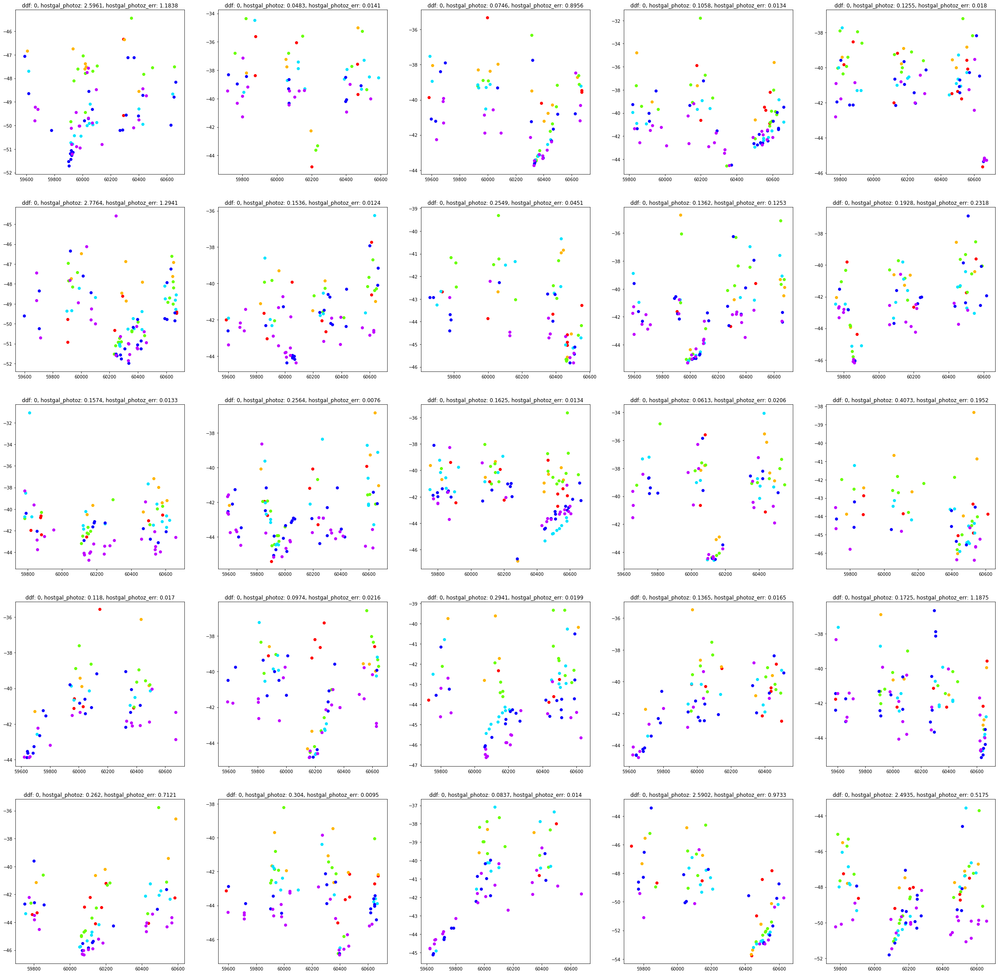

In [124]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_42.sample(25, random_state=69)):
    ax = axs[i%5, i//5]
    df = set_meta_df[set_meta_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_magnitude(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

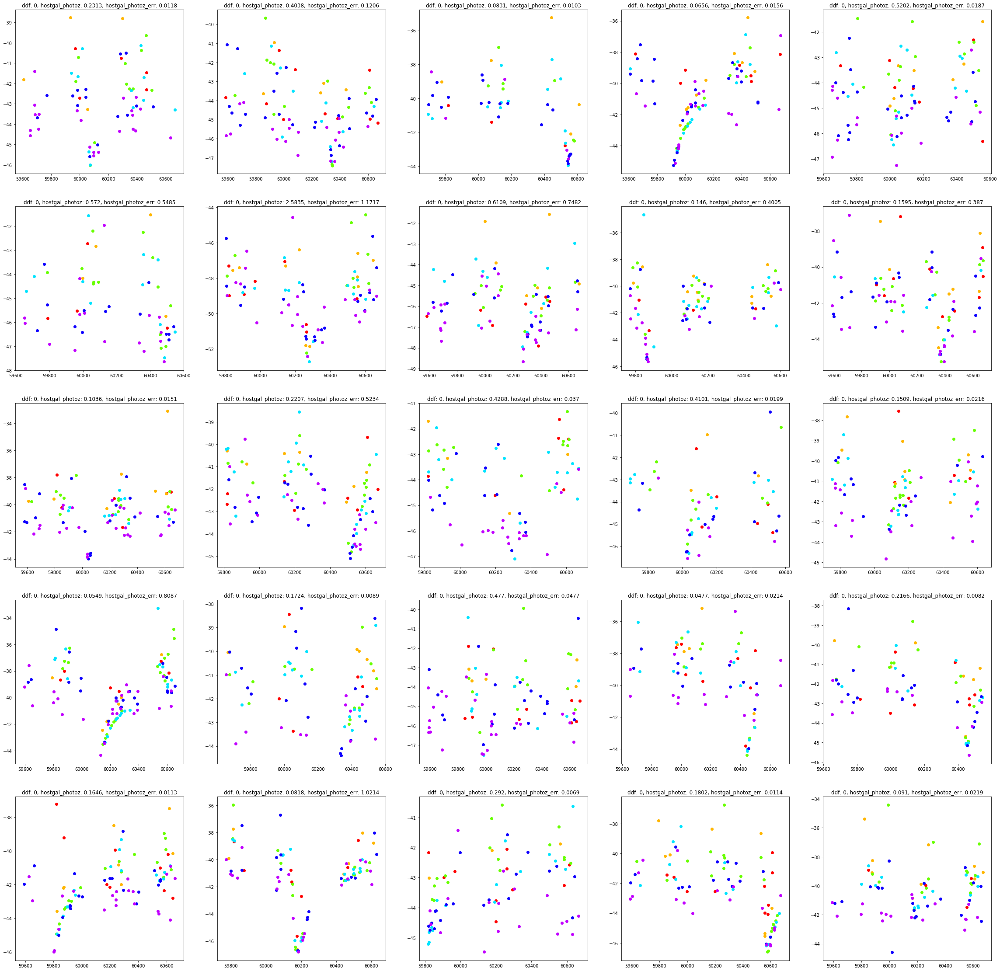

In [125]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_52.sample(25, random_state=69)):
    ax = axs[i%5, i//5]
    df = set_meta_df[set_meta_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_magnitude(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

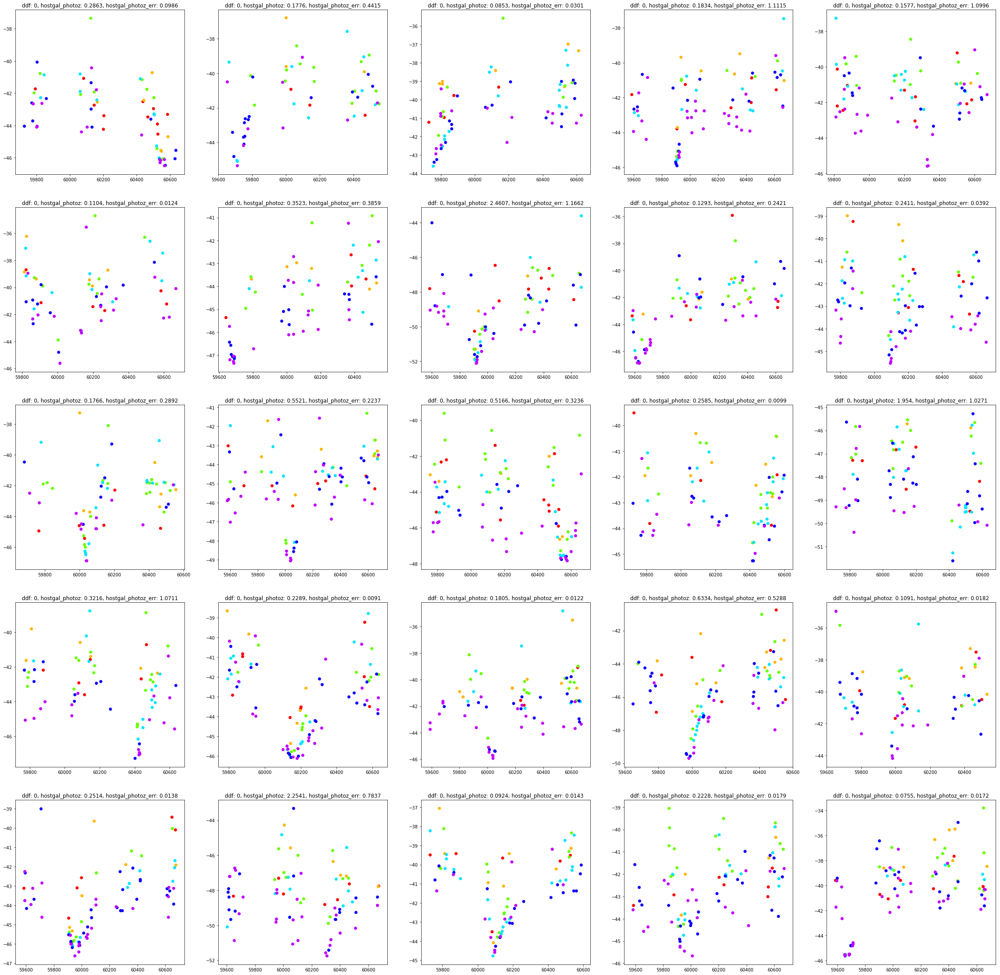

In [126]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_62.sample(25, random_state=69)):
    ax = axs[i%5, i//5]
    df = set_meta_df[set_meta_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_magnitude(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

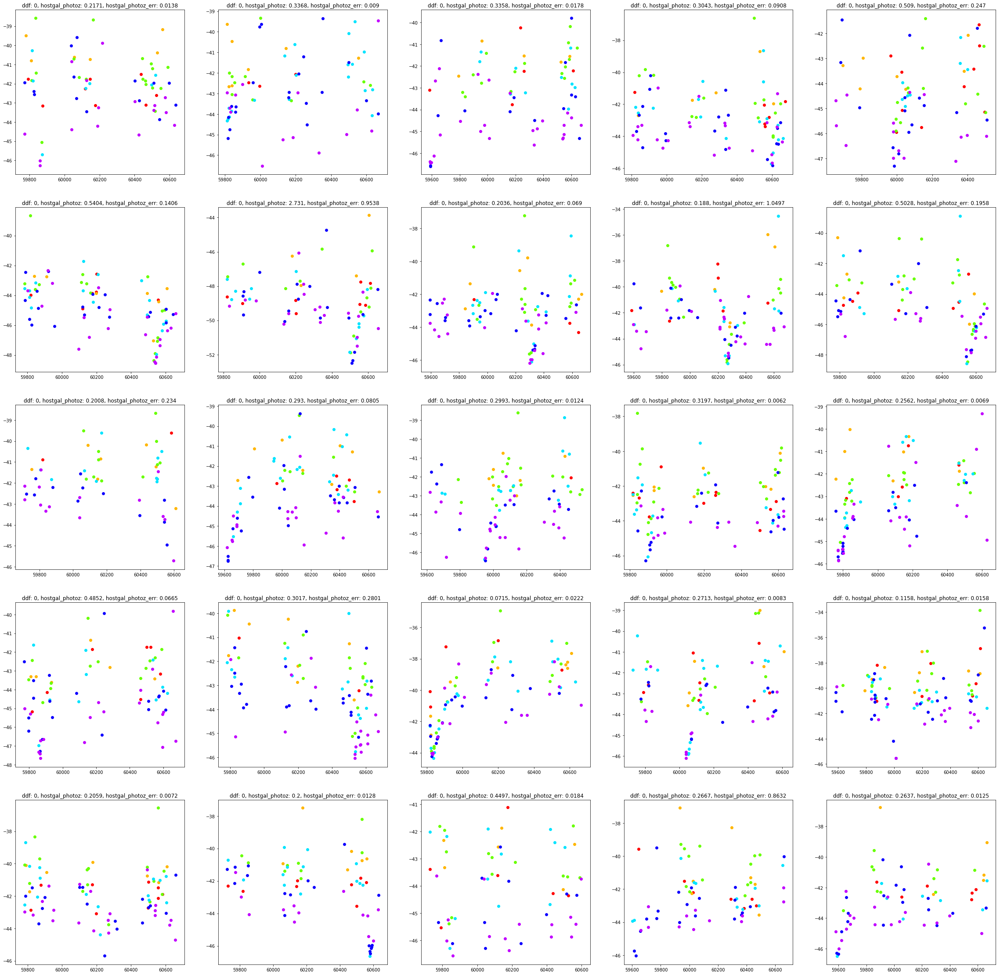

In [127]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_67.sample(25, random_state=69)):
    ax = axs[i%5, i//5]
    df = set_meta_df[set_meta_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_magnitude(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

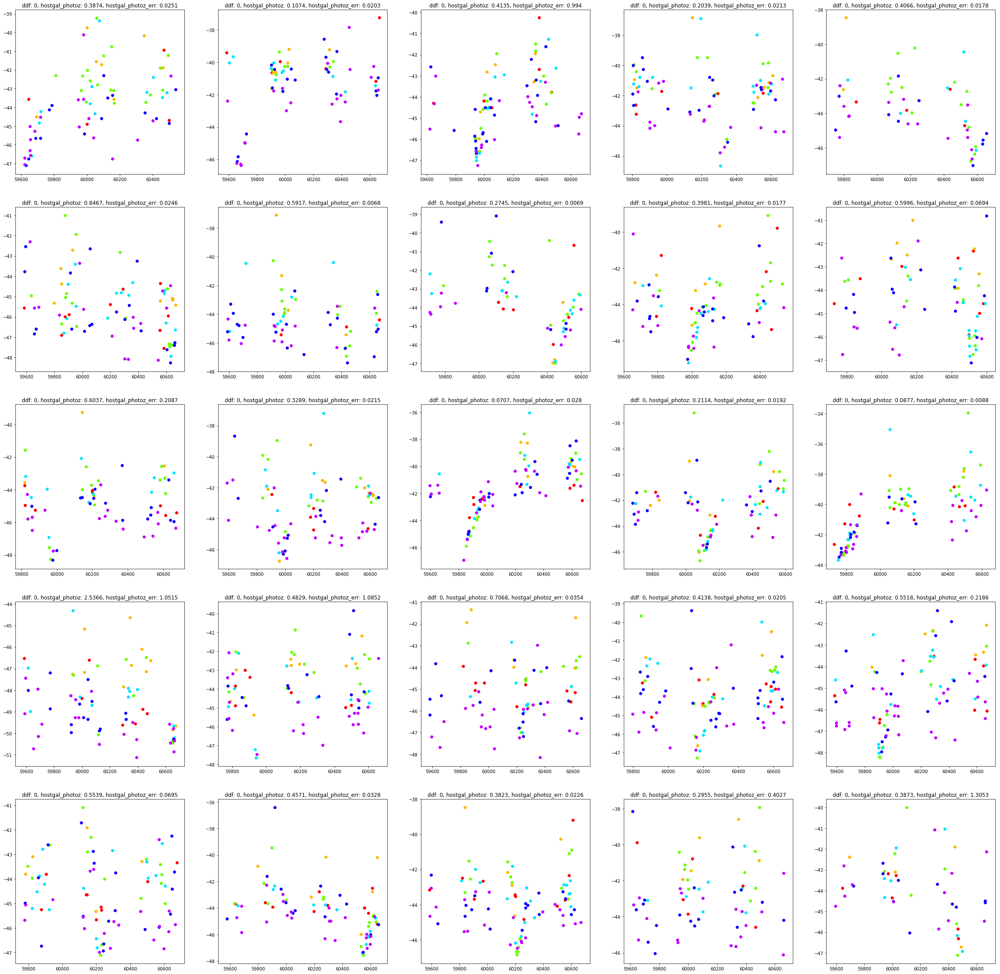

In [128]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=69)):
    ax = axs[i%5, i//5]
    df = set_meta_df[set_meta_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_magnitude(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

In [133]:
%%time
for i in range(100000000):
    i + 1

CPU times: user 6.6 s, sys: 8 ms, total: 6.61 s
Wall time: 6.61 s


In [142]:
%%time
def _get_peak_mjd(df):
    return df[df.flux == df.flux.max()].iloc[0].mjd

display(set_meta_df.merge(set_meta_df.groupby('object_id').apply(_get_peak_mjd).reset_index().rename(columns={0: 'peak_mjd'}), on='object_id', how='left'))

,object_id,mjd,passband,flux,flux_err,detected,phase,ra,decl,gal_l,...,hostgal_photoz_err,distmod,mwebv,target,magnitude,abs_magnitude,spec_distmod,lumidist,luminosity,0
0,615,59750.4229,2,-544.810303,3.622952,1,0.816429,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
1,615,59750.4306,1,-816.434326,5.553370,1,0.840157,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
2,615,59750.4383,3,-471.385529,3.801213,1,0.863886,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
3,615,59750.4450,4,-388.984985,11.395031,1,0.884533,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
4,615,59752.4070,2,-681.858887,4.041204,1,0.930728,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
5,615,59752.4147,1,-1061.457031,6.472994,1,0.954457,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
6,615,59752.4224,3,-524.954590,3.552751,1,0.978185,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
7,615,59752.4334,4,-393.480225,3.599346,1,0.012084,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
8,615,59752.4435,5,-355.886780,10.421921,1,0.043208,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415
9,615,59767.2968,2,-548.013550,3.462291,1,0.815862,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,60249.0415


CPU times: user 7.14 s, sys: 1.99 s, total: 9.14 s
Wall time: 9.12 s


In [138]:
#%%time
#set_meta_df.merge(set_meta_df.groupby('object_id').flux.max().reset_index(), on='object_id', how='left')

CPU times: user 600 ms, sys: 768 ms, total: 1.37 s
Wall time: 1.37 s


,object_id,mjd,passband,flux_x,flux_err,detected,phase,ra,decl,gal_l,...,hostgal_photoz_err,distmod,mwebv,target,magnitude,abs_magnitude,spec_distmod,lumidist,luminosity,flux_y
0,615,59750.4229,2,-544.810303,3.622952,1,0.816429,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
1,615,59750.4306,1,-816.434326,5.553370,1,0.840157,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
2,615,59750.4383,3,-471.385529,3.801213,1,0.863886,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
3,615,59750.4450,4,-388.984985,11.395031,1,0.884533,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
4,615,59752.4070,2,-681.858887,4.041204,1,0.930728,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
5,615,59752.4147,1,-1061.457031,6.472994,1,0.954457,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
6,615,59752.4224,3,-524.954590,3.552751,1,0.978185,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
7,615,59752.4334,4,-393.480225,3.599346,1,0.012084,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
8,615,59752.4435,5,-355.886780,10.421921,1,0.043208,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343
9,615,59767.2968,2,-548.013550,3.462291,1,0.815862,349.046051,-61.943836,320.796530,...,0.0,NaN,0.017,92,NaN,NaN,-inf,NaN,NaN,660.626343


In [145]:
df = pd.read_feather('../features/train/meta_features.ftr')
df

,object_id,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,...,passband_flux_means_var,passband_flux_counts_var,passband_detected_means_var,band_flux_diff_max,band_flux_diff_min,band_flux_diff_diff,band_flux_diff_diff_rat,band_flux_max_min_rat,internal,lumi_dist
0,615,349.046051,-61.943836,320.796530,-51.753706,1,0.0000,0.0000,0.0000,NaN,...,1.873312e+04,0.000038,0.002692,1761.066406,242.096031,1518.970375,0.862529,0.137471,True,NaN
1,713,53.085938,-27.784405,223.525509,-54.460748,1,1.8181,1.6267,0.2552,45.4063,...,5.650007e-01,0.000267,0.012968,29.245007,20.596960,8.648047,0.295710,0.704290,False,1.205758e+10
2,730,33.574219,-6.579593,170.455585,-61.548219,1,0.2320,0.2262,0.0157,40.2561,...,4.002012e+00,0.000639,0.003779,66.469870,9.086189,57.383681,0.863304,0.136696,False,1.125175e+09
3,745,0.189873,-45.586655,328.254458,-68.969298,1,0.3037,0.2813,1.1523,40.7951,...,2.244294e+01,0.000356,0.010809,222.954965,21.888378,201.066587,0.901826,0.098174,False,1.442182e+09
4,1124,352.711273,-63.823658,316.922299,-51.059403,1,0.1934,0.2415,0.0176,40.4166,...,1.622351e+01,0.000038,0.014505,160.143942,12.135630,148.008312,0.924220,0.075780,False,1.211490e+09
5,1227,35.683594,-5.379379,171.992947,-59.253501,1,0.0000,0.0000,0.0000,NaN,...,3.585849e-01,0.000639,0.000097,75.496267,5.818507,69.677760,0.922930,0.077070,True,NaN
6,1598,347.846710,-64.760857,318.929827,-49.143596,1,0.1352,0.1820,0.0304,39.7279,...,1.454288e+02,0.000038,0.000414,1452.220082,283.208631,1169.011451,0.804982,0.195018,False,8.822263e+08
7,1632,348.595886,-63.072620,320.023289,-50.713060,1,0.6857,0.7014,0.0100,43.1524,...,5.553989e+00,0.000038,0.000209,49.085574,7.044729,42.040845,0.856481,0.143519,False,4.270513e+09
8,1920,149.414062,3.433834,234.919132,42.245550,1,0.3088,0.3229,0.3360,41.1401,...,7.777181e+01,0.000577,0.003181,235.585912,25.928959,209.656953,0.889938,0.110062,False,1.690519e+09
9,1926,149.414062,1.940072,236.565366,41.393323,1,0.0000,0.0000,0.0000,NaN,...,1.186071e+00,0.000577,0.000416,68.371399,7.152100,61.219299,0.895393,0.104607,True,NaN


### SN を plot してみる

In [62]:
colors = ['#FF0000', '#FFB600', '#68FF00', '#00E4FF', '#0F00FF', '#C100FF', ]

def plot_passbands_sn(df, ax):
    df = df.copy()
    df['sn_flux'] = np.power(df.flux/df.flux_err, 2.)
    for passband in [0, 1, 2, 3, 4, 5]:
        band_df = df[df.passband == passband]
        ax.scatter(x=band_df.mjd, y=band_df.sn_flux, color=colors[passband])

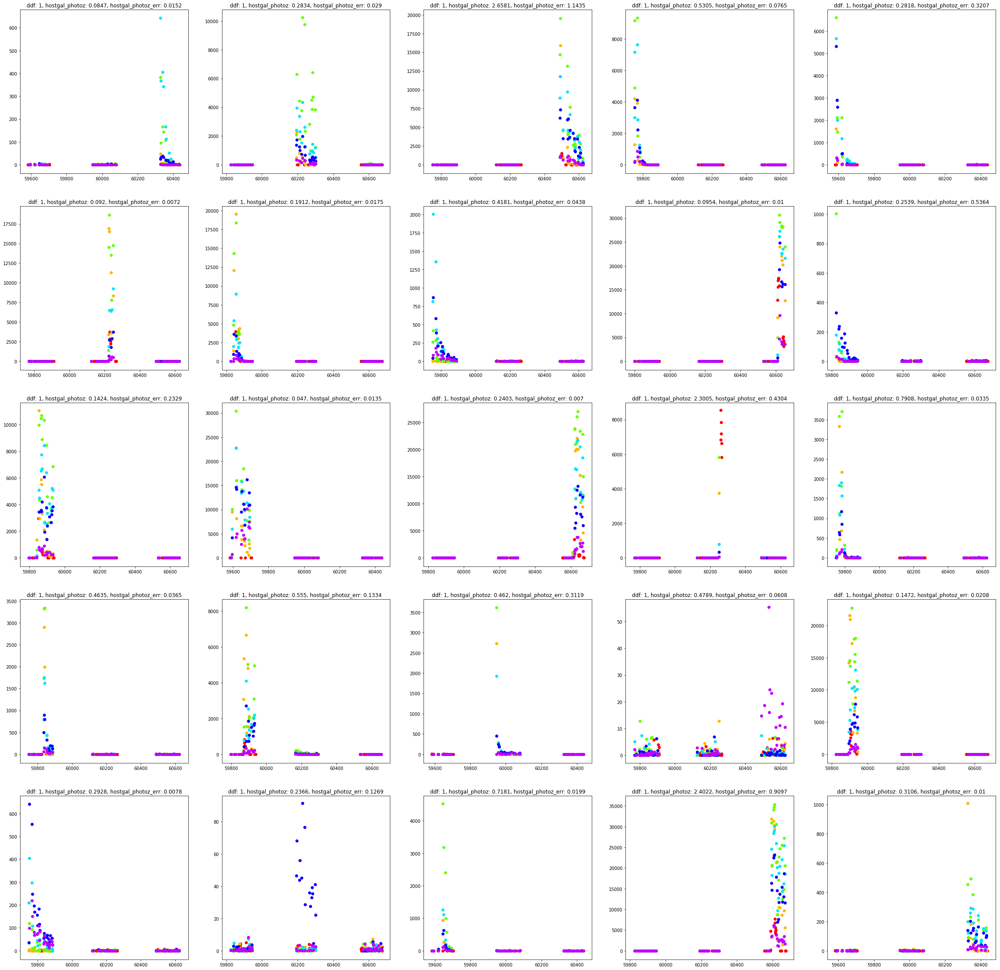

In [38]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_42.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

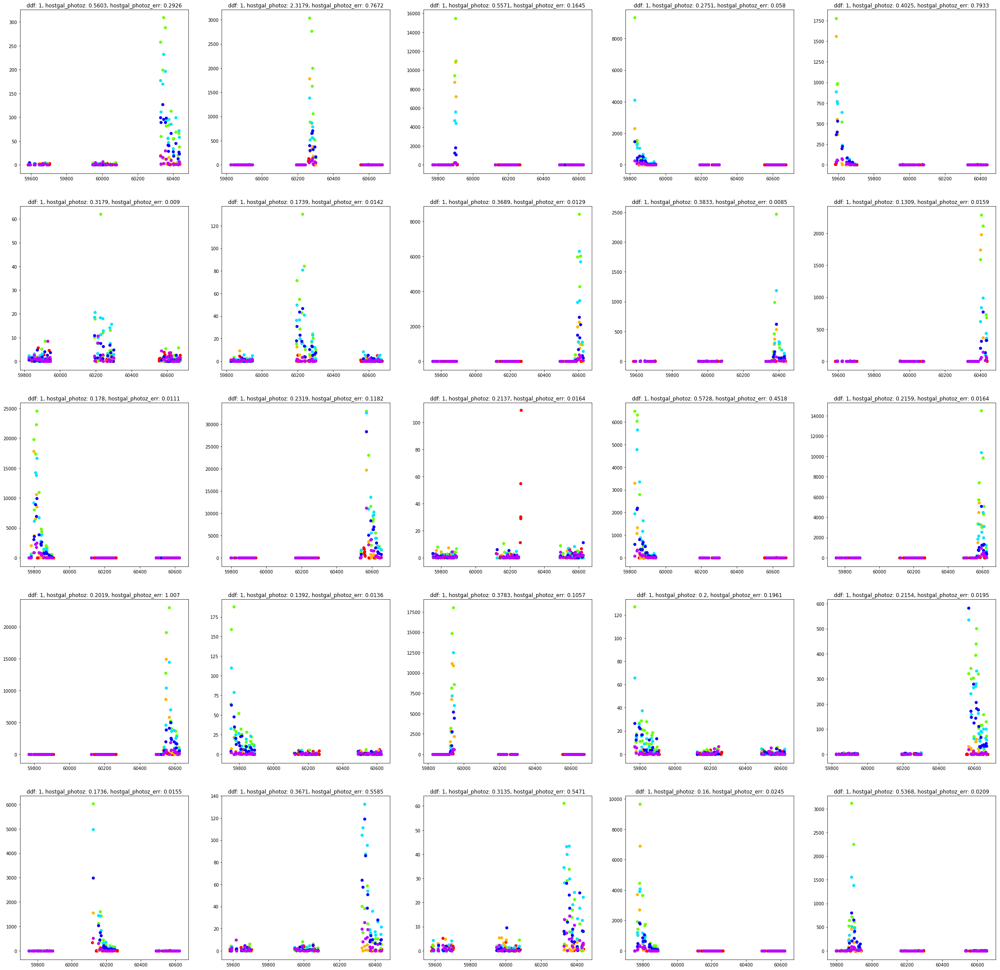

In [39]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_52.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

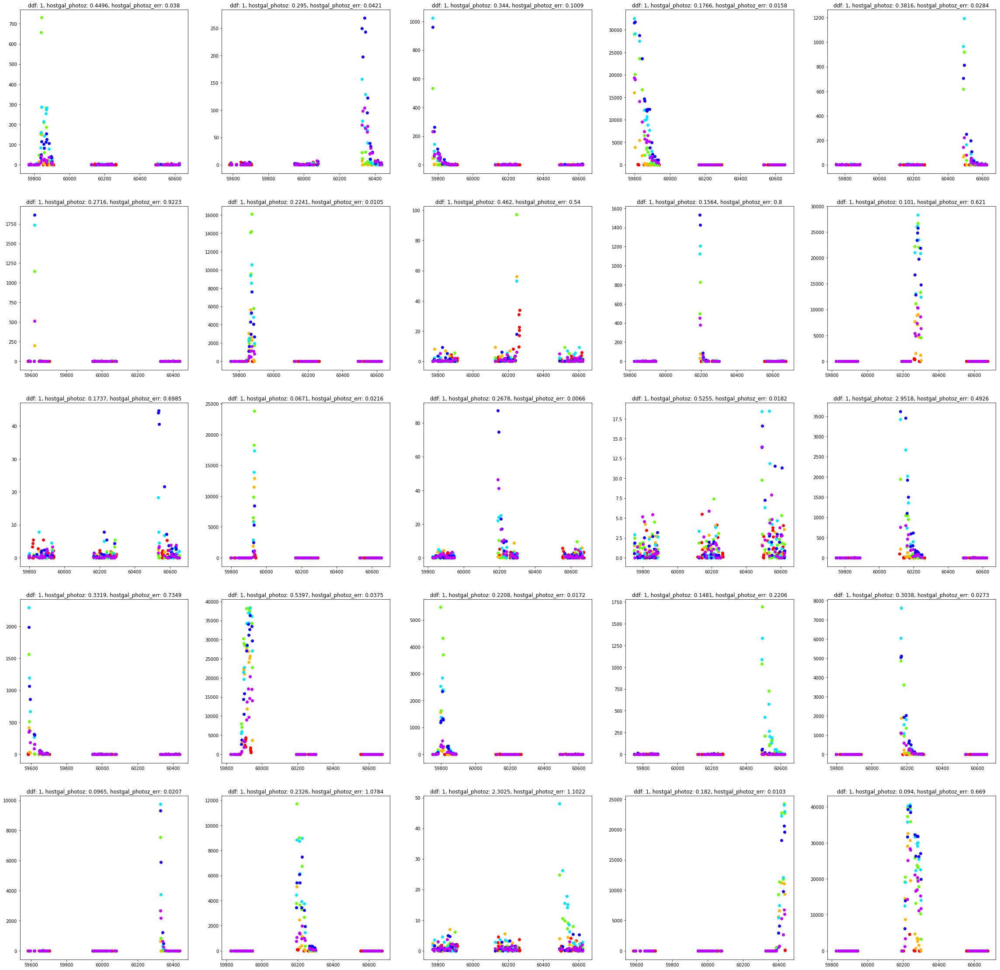

In [40]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_62.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

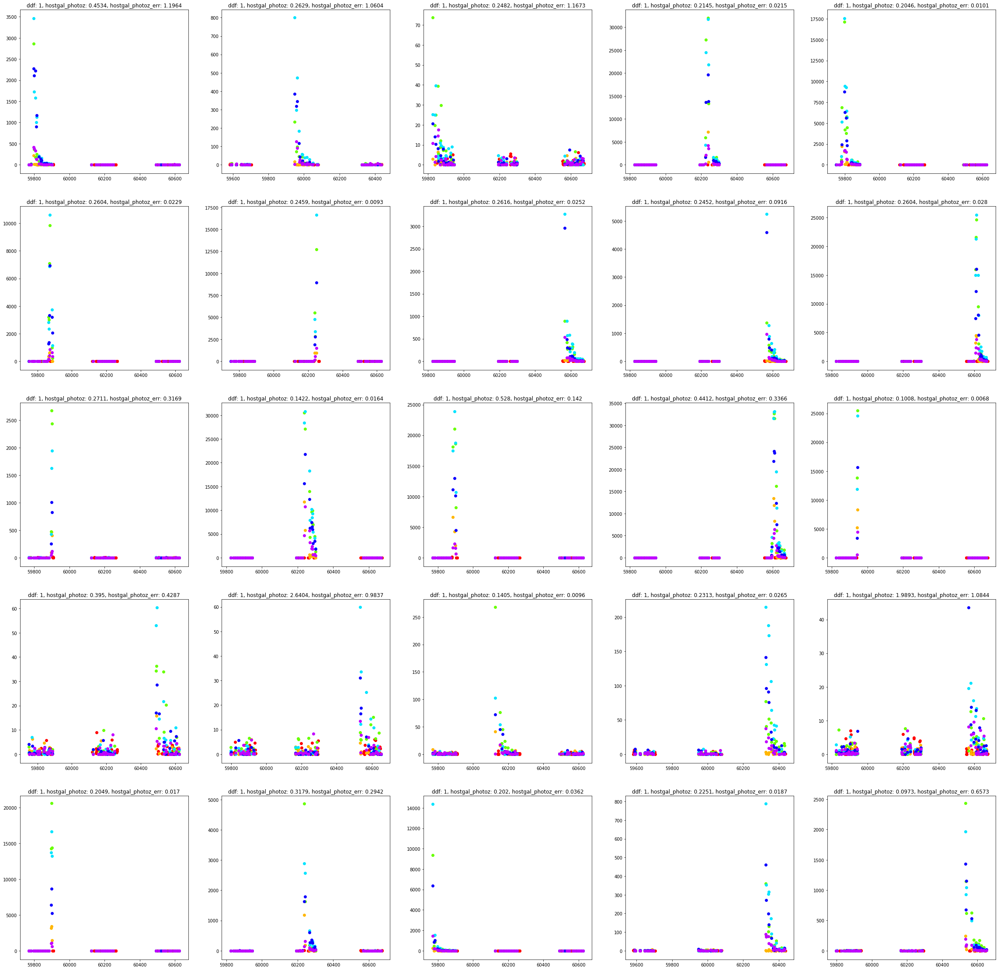

In [41]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_67.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

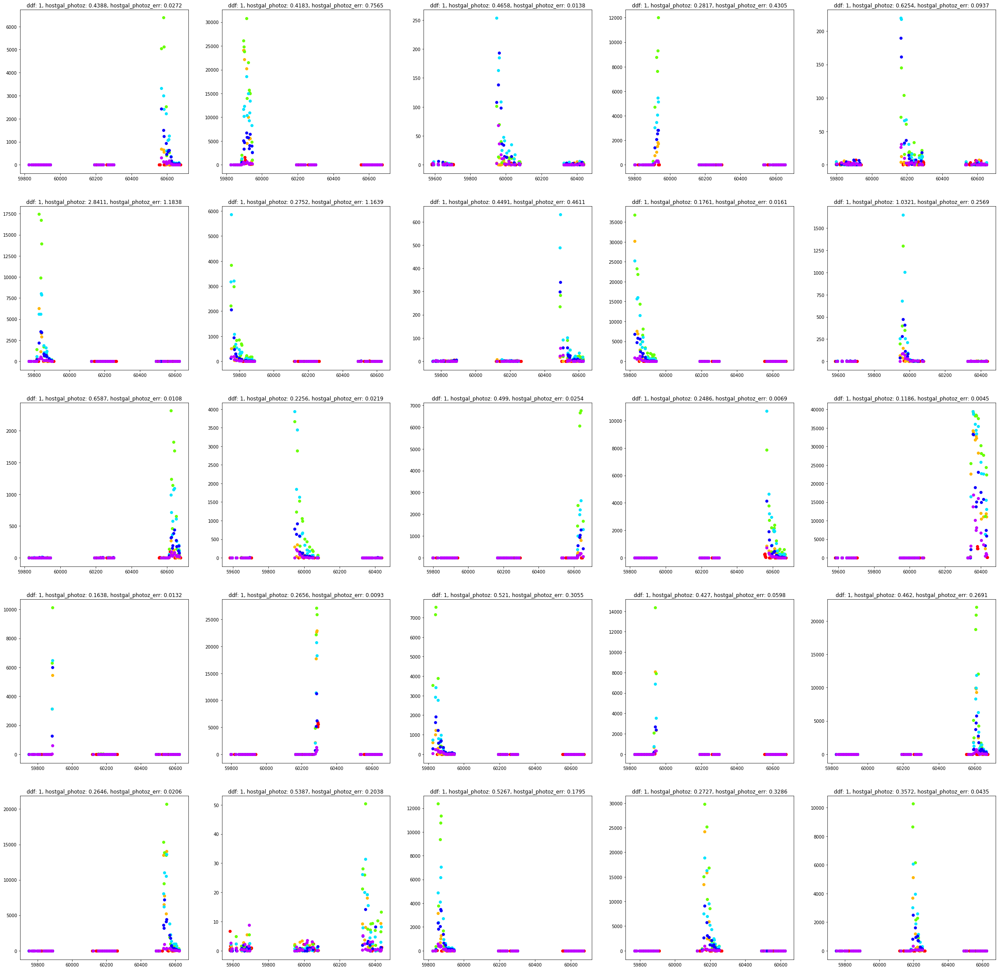

In [42]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(40, 40))

for i, obj_id in enumerate(obj_90.sample(25, random_state=71)):
    ax = axs[i%5, i//5]
    df = set_df[set_df.object_id == obj_id]
    meta = meta_df[meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()   

### test では？

In [48]:
#test_set_df = pd.read_csv('/home/naoya.taguchi/.kaggle/competitions/PLAsTiCC-2018/test_set_sample.csv')
test_set_df = pd.read_feather('/home/naoya.taguchi/.kaggle/competitions/PLAsTiCC-2018/test_set.fth')
test_set_meta_df = pd.read_csv('/home/naoya.taguchi/.kaggle/competitions/PLAsTiCC-2018/test_set_metadata.csv')

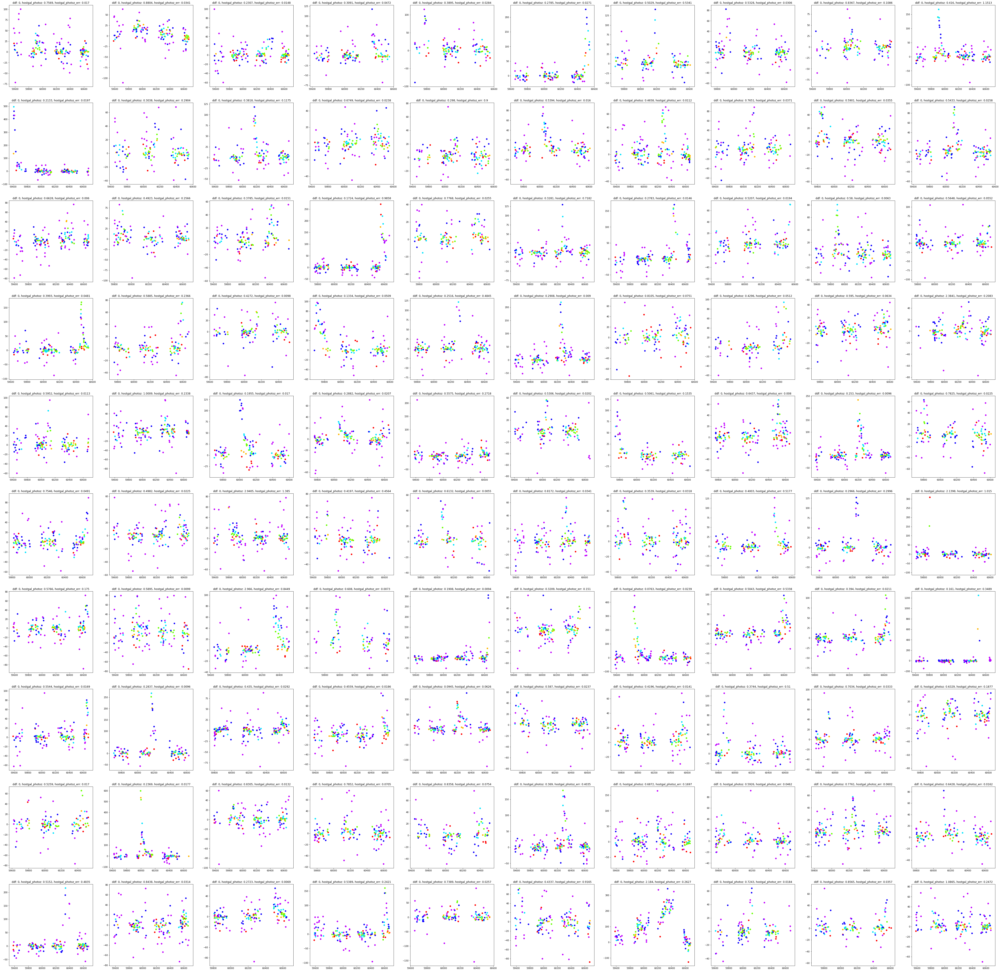

In [70]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(10, 10, figsize=(80, 80))

for i, obj_id in enumerate(test_set_meta_df[(test_set_meta_df.ddf == 0) & (test_set_meta_df.distmod.notnull())].object_id.sample(100, random_state=70)):
    ax = axs[i%10, i//10]
    df = test_set_df[test_set_df.object_id == obj_id]
    meta = test_set_meta_df[test_set_meta_df.object_id == obj_id]
    plot_passbands(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()

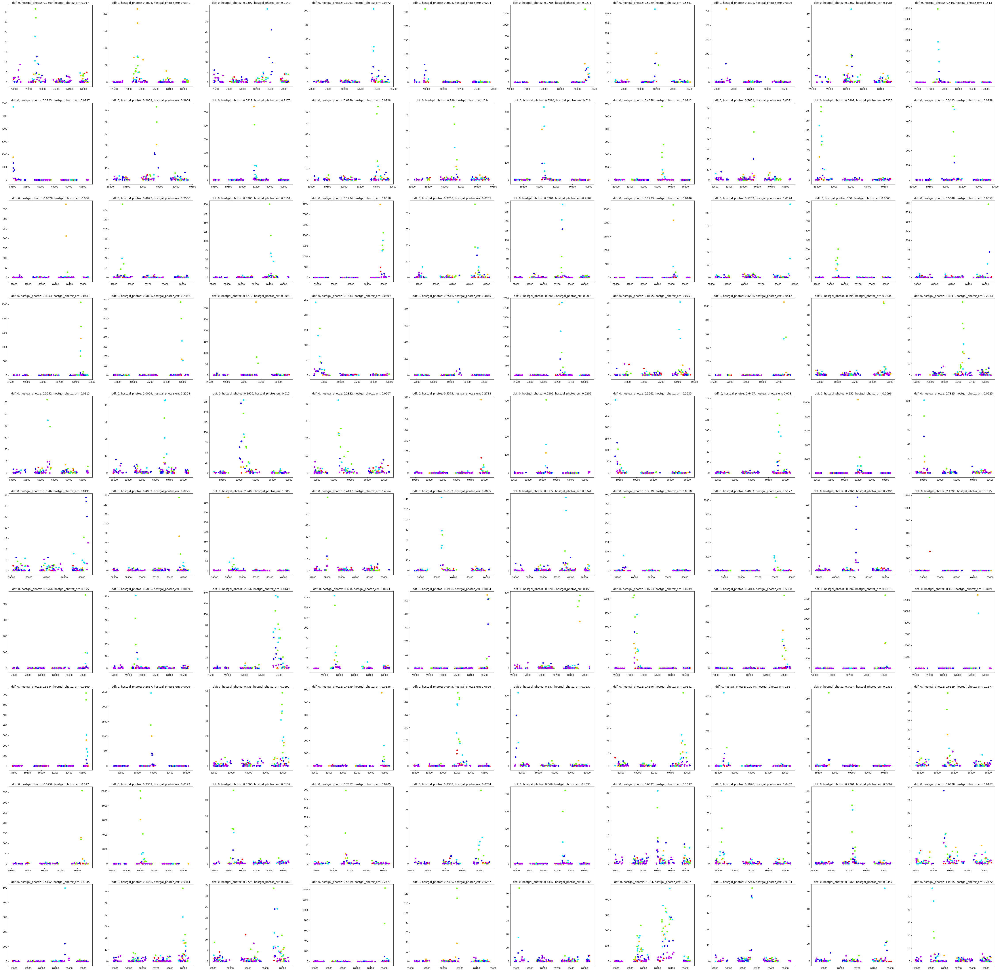

In [71]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(10, 10, figsize=(80, 80))

for i, obj_id in enumerate(test_set_meta_df[(test_set_meta_df.ddf == 0) & (test_set_meta_df.distmod.notnull())].object_id.sample(100, random_state=70)):
    ax = axs[i%10, i//10]
    df = test_set_df[test_set_df.object_id == obj_id]
    meta = test_set_meta_df[test_set_meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()

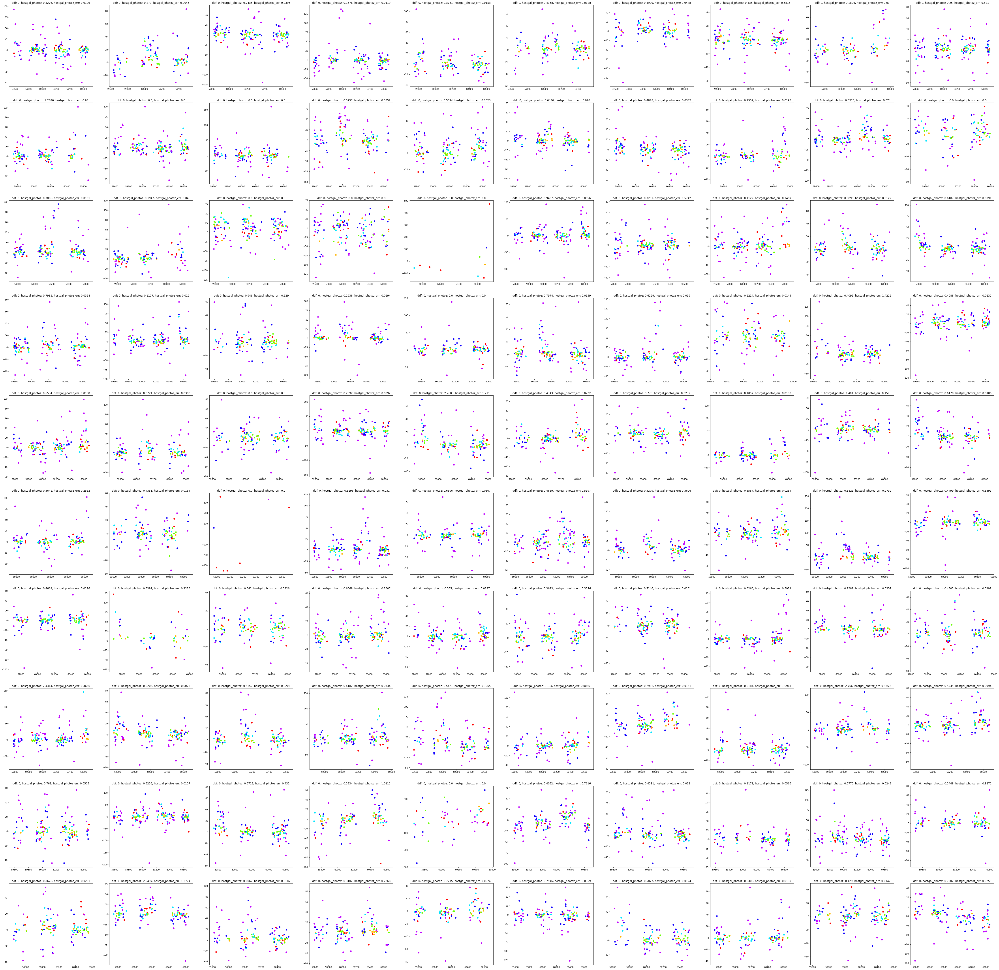

In [54]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(10, 10, figsize=(80, 80))

for i, obj_id in enumerate(test_set_meta_df[(test_set_meta_df.ddf == 0)].object_id.sample(100, random_state=70)):
    ax = axs[i%10, i//10]
    df = test_set_df[test_set_df.object_id == obj_id]
    meta = test_set_meta_df[test_set_meta_df.object_id == obj_id]
    plot_passbands(df[df.detected==0], ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()

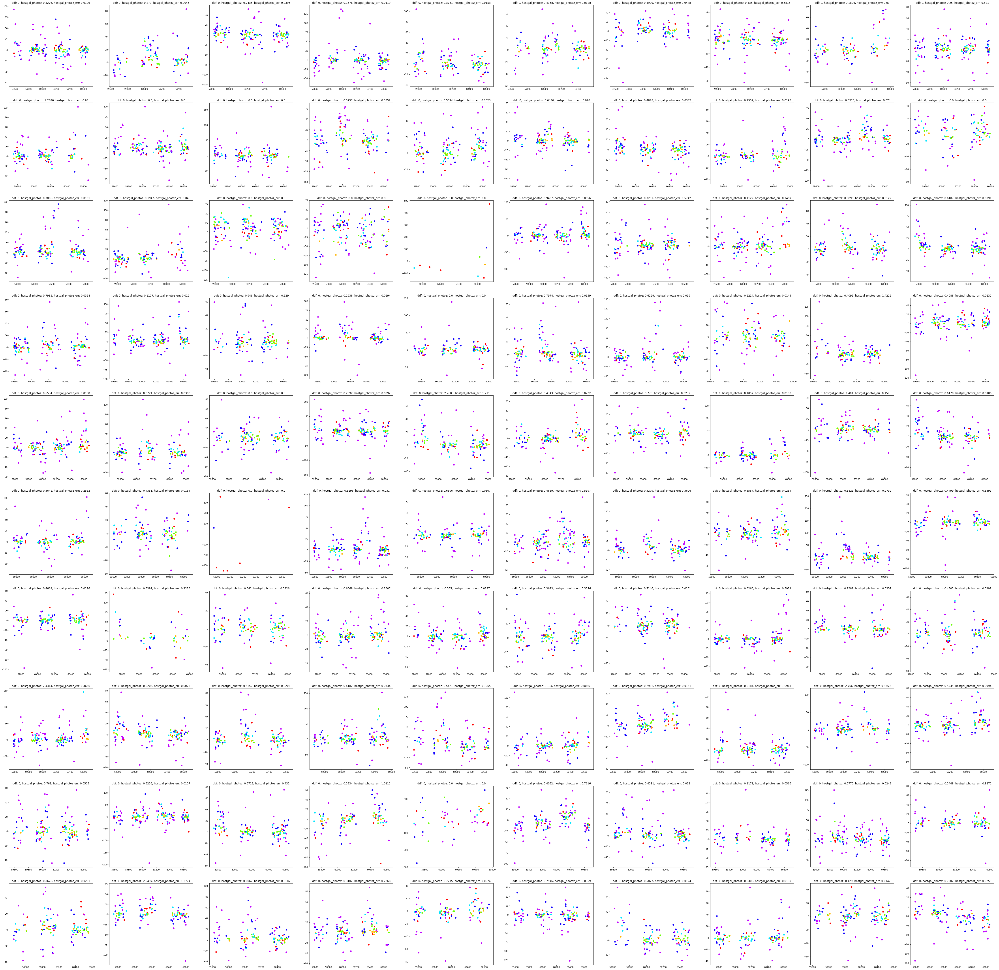

In [54]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(10, 10, figsize=(80, 80))

for i, obj_id in enumerate(test_set_meta_df[(test_set_meta_df.ddf == 0)].object_id.sample(100, random_state=70)):
    ax = axs[i%10, i//10]
    df = test_set_df[test_set_df.object_id == obj_id]
    meta = test_set_meta_df[test_set_meta_df.object_id == obj_id]
    plot_passbands_sn(df, ax)
    ax.set_title(f'ddf: {meta.ddf.values[0]}, hostgal_photoz: {meta.hostgal_photoz.values[0]}, hostgal_photoz_err: {meta.hostgal_photoz_err.values[0]}')
plt.show ()

In [74]:
import seaborn as sns

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


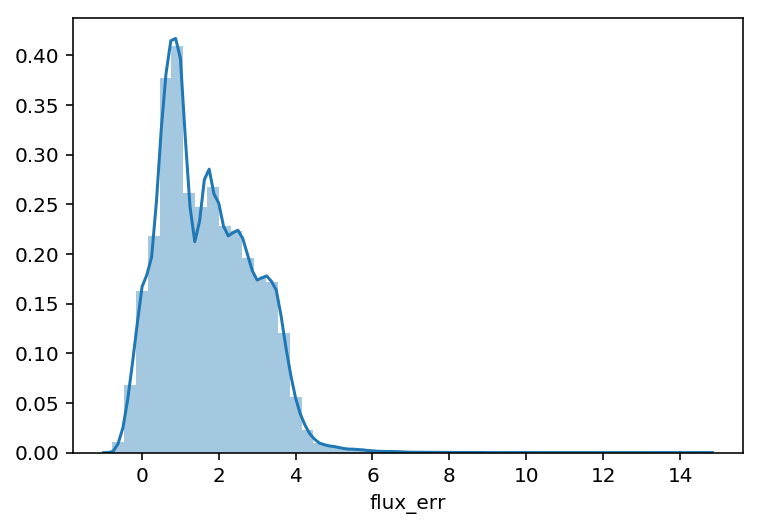

In [86]:
sns.distplot(np.log(set_df.flux_err))

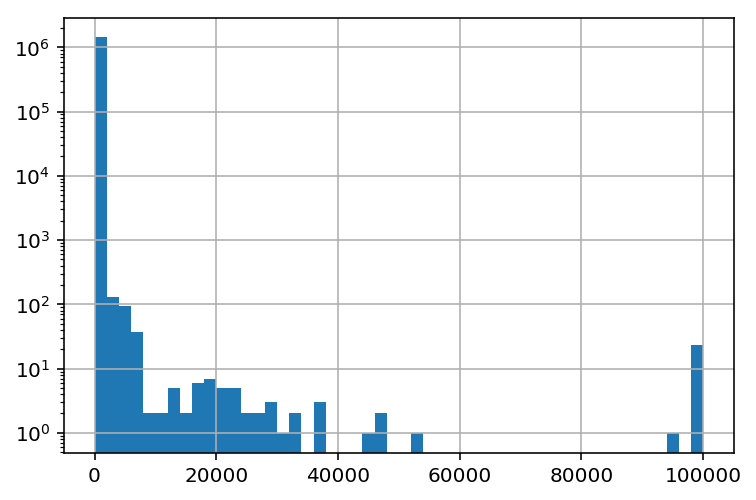

In [89]:
ax = set_df.flux_err.clip_upper(100000).hist(bins=50)
ax.set_yscale('log')

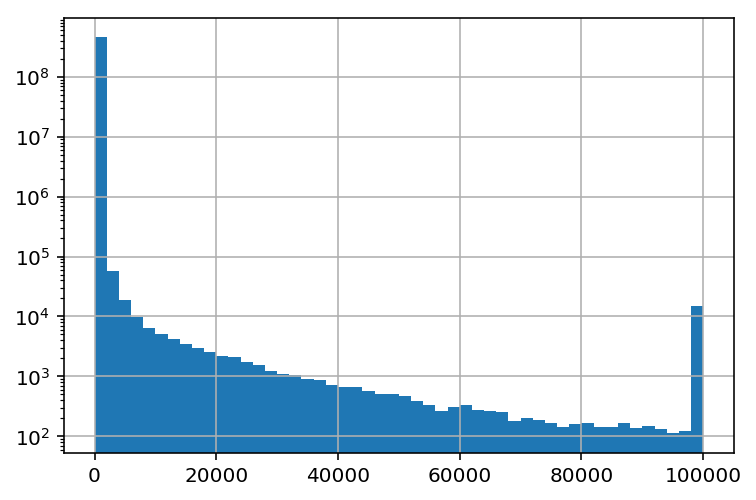

In [91]:
ax = test_set_df.flux_err.clip_upper(100000).hist(bins=50)
ax.set_yscale('log')

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


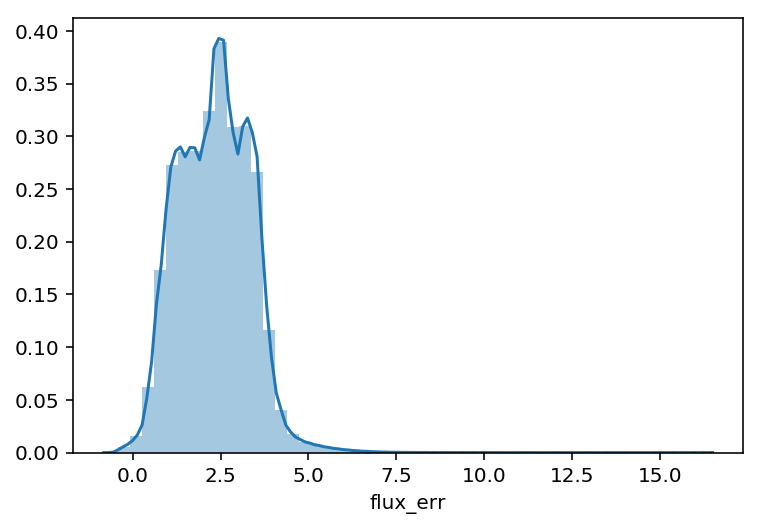

In [85]:
sns.distplot(np.log(test_set_df.flx_err))

In [ ]:
%%load_time

In [96]:
set_df.groupby(['object_id', 'passband']).flux.std().unstack(level=1).mean(axis=0)#.mean(axis=)

passband
0    218.255899
1    188.291251
2    204.791323
3    198.862866
4    204.063537
5    219.272710
dtype: float64

In [97]:
test_set_df.groupby(['object_id', 'passband']).flux.std().unstack(level=1).mean(axis=0)#.mean(axis=)

passband
0    299.689792
1    194.833003
2    166.943944
3    137.493016
4    128.347308
5    139.867683
dtype: float64

In [141]:
def bazin(time, A, B, t0, tfall, trise):
    X = np.exp(-(time - t0) / tfall) / (1 + np.exp((time - t0) / trise))
    return A * X + B


from scipy.optimize import least_squares

def lightcurve_fit(time, flux):
    scaled_time = time - time.min()
    t0 = scaled_time[flux.argmax()]
    guess = (0, 0, t0, 40, -5)
    #guess = (0, 0, t0, 40, -30)

    errfunc = lambda params: abs(flux - bazin(scaled_time, *params))

    result = least_squares(errfunc, guess, method='lm')

    return result.x

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: 'argmax' is deprecated, use 'idxmax' instead. The behavior of 'argmax'
will be corrected to return the positional maximum in the future.
Use 'series.values.argmax' to get the position of the maximum now.
  # Remove the CWD from sys.path while we load stuff.
/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


Text(0.5,1,'band')

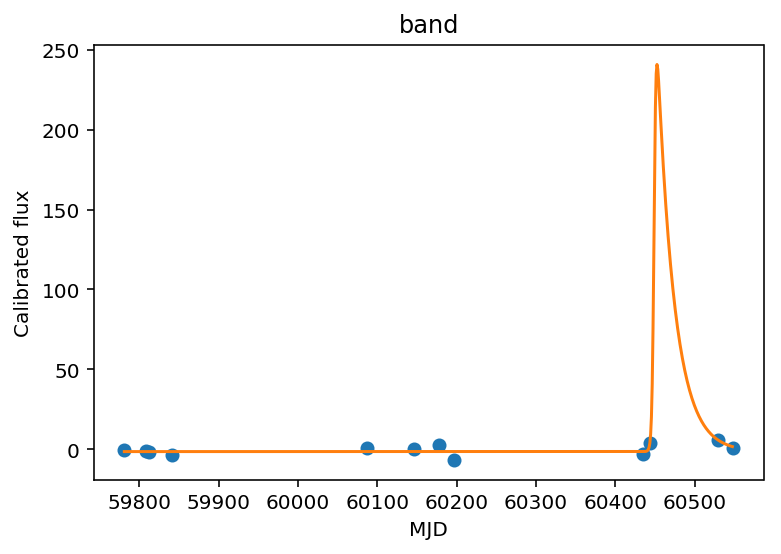

In [118]:
#OBJ = 130695262
#OBJ = 106903418
OBJ = 50949719
band = 1

fig, ax = plt.subplots(1, 1, )

time = set_df[(set_df.object_id == OBJ) & (set_df.passband == band)].mjd
flux =  set_df[(set_df.object_id == OBJ) & (set_df.passband == band)].flux

fit = lightcurve_fit(time, flux)
stime = np.arange(time.min(), time.max())

ax.plot(time, flux, 'o')
ax.plot(stime, bazin(stime - stime.min(), *fit))
ax.set_xlabel('MJD')
ax.set_ylabel('Calibrated flux')
ax.set_title('band')

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: 'argmax' is deprecated, use 'idxmax' instead. The behavior of 'argmax'
will be corrected to return the positional maximum in the future.
Use 'series.values.argmax' to get the position of the maximum now.
  # Remove the CWD from sys.path while we load stuff.
/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


(0, 1500)

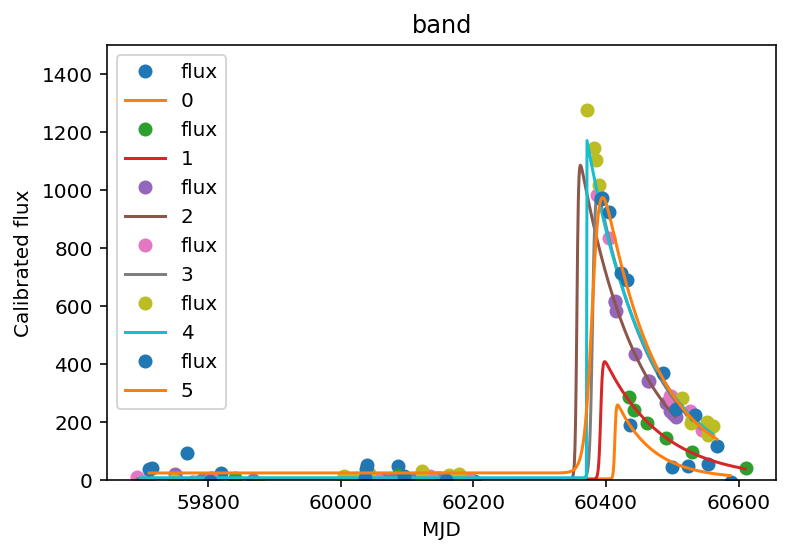

In [135]:
#OBJ = 130695262
#OBJ = 106903418
#OBJ = 50949719
#OBJ = 129340954
OBJ = 93035432
#band = 2
    
fig, ax = plt.subplots(1, 1, )
df = test_set_df[(test_set_df.object_id == OBJ)]
for band in [0, 1, 2, 3, 4, 5]:
    
    time = df[(df.passband == band)].mjd
    flux =  df[(df.passband == band)].flux
    
    fit = lightcurve_fit(time, flux)
    stime = np.arange(time.min(), time.max())
    
    ax.plot(time, flux, 'o')
    ax.plot(stime, bazin(stime - stime.min(), *fit), label=band)
    ax.set_xlabel('MJD')
    ax.set_ylabel('Calibrated flux')
    ax.set_title('band')
    ax.legend()
ax.set_ylim(0, 1500)

/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: 'argmax' is deprecated, use 'idxmax' instead. The behavior of 'argmax'
will be corrected to return the positional maximum in the future.
Use 'series.values.argmax' to get the position of the maximum now.
  # Remove the CWD from sys.path while we load stuff.
/home/naoya.taguchi/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


(0, 1500)

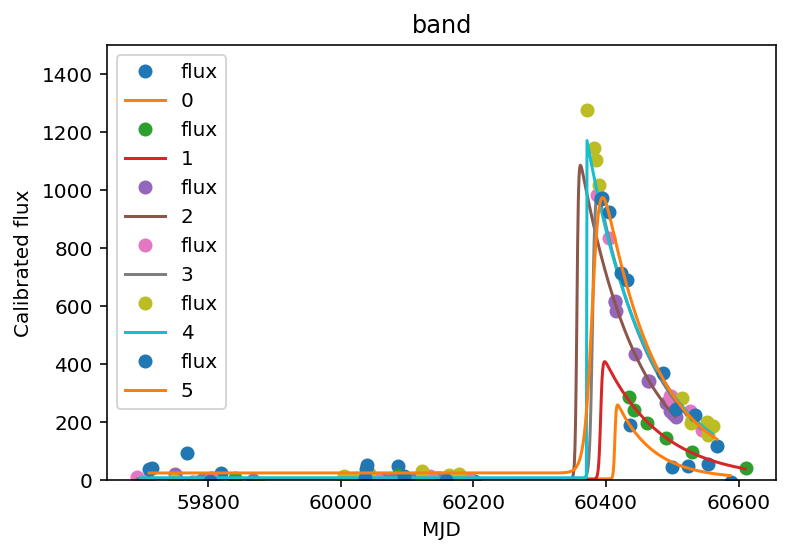

In [142]:
#OBJ = 130695262
#OBJ = 106903418
#OBJ = 50949719
#OBJ = 129340954
OBJ = 93035432
#band = 2
    
fig, ax = plt.subplots(1, 1, )
df = test_set_df[(test_set_df.object_id == OBJ)]
for band in [0, 1, 2, 3, 4, 5]:
    
    time = df[(df.passband == band)].mjd
    flux =  df[(df.passband == band)].flux
    
    fit = lightcurve_fit(time, flux)
    stime = np.arange(time.min(), time.max())
    
    ax.plot(time, flux, 'o')
    ax.plot(stime, bazin(stime - stime.min(), *fit), label=band)
    ax.set_xlabel('MJD')
    ax.set_ylabel('Calibrated flux')
    ax.set_title('band')
    ax.legend()
ax.set_ylim(0, 1500)